# Worker Detection and Zone Tracking System
## MSc Artificial Intelligence — Thesis Project
### Bahrain Polytechnic | 2026

**Pipeline:** YOLOv8 Transfer Learning → CRNN-CTC Recognition → ByteTrack → Polygon Geofencing
**Dataset:** Industrial workforce dataset — 151 annotated images, 669 after augmentation
**Classes:** worker | vest_number

## ⚠ Run these 3 cells at the start of every session:
## Cell 1 → Cell 2 → Quick Reload Cell
## Everything else is already saved to Drive

In [ ]:
# ============================================================
# CELL 0 — RUN THIS FIRST AT THE START OF EVERY SESSION
# ============================================================

# Step 1 — Install libraries
!pip install ultralytics roboflow opencv-python-headless -q

# Step 2 — Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Step 3 — Import libraries
import os, shutil, yaml, torch
import cv2
import numpy as np

# Step 4 — Copy preprocessed dataset from Drive to Colab
src = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Preprocessed_Dataset'
dst = '/content/Preprocessed_Dataset'

if os.path.exists(dst):
    shutil.rmtree(dst)

print("Loading dataset from Drive...")
shutil.copytree(src, dst)

# Step 5 — Fix yaml paths
yaml_path = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Preprocessed_Dataset/data.yaml'
with open(yaml_path, 'r') as f:
    data = yaml.safe_load(f)

data['train'] = '/content/Preprocessed_Dataset/train/images'
data['val']   = '/content/Preprocessed_Dataset/valid/images'
data['test']  = '/content/Preprocessed_Dataset/test/images'

with open(yaml_path, 'w') as f:
    yaml.dump(data, f)

# Step 6 — Confirm everything is ready
print("\n" + "="*50)
print("SESSION READY")
print("="*50)
print(f"GPU    : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'NOT AVAILABLE ⚠'}")
for split in ['train', 'valid', 'test']:
    count = len(os.listdir(f'{dst}/{split}/images'))
    print(f"{split:6s} : {count} images")
print("="*50)
print("✓ Ready — you can now run any cell from Cell 12 onward")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading dataset from Drive...

SESSION READY
GPU    : Tesla T4
train  : 624 images
valid  : 30 images
test   : 15 images
✓ Ready — you can now run any cell from Cell 12 onward


In [ ]:
# Cell 1 — Install required libraries
!pip install ultralytics roboflow opencv-python-headless -q

print("✓ Libraries installed")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 50.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.9/276.9 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 43.0 MB/s eta 0:00:00
✓ Libraries installed


In [ ]:
# Cell 2 — Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

print("✓ Google Drive mounted")

Mounted at /content/drive
✓ Google Drive mounted


In [ ]:
# Cell 3 — Copy and unzip dataset from Google Drive
import zipfile
import os

# Path to your zip file in Google Drive
zip_path = "/content/drive/MyDrive/Colab Notebooks/Worker-Detection.yolov8.zip"

# Destination folder in Colab
extract_path = "/content/Industry_Dataset"

# Unzip
print("Unzipping dataset...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✓ Dataset extracted to:", extract_path)

# Verify structure
for folder in os.listdir(extract_path):
    print(" ", folder)

Unzipping dataset...
✓ Dataset extracted to: /content/Industry_Dataset
  train
  valid
  data.yaml
  test
  README.dataset.txt
  README.roboflow.txt


In [ ]:
# Cell 4 — Read and verify data.yaml
import yaml

yaml_path = "/content/Industry_Dataset/data.yaml"

with open(yaml_path, 'r') as f:
    data = yaml.safe_load(f)

print("Current data.yaml contents:")
print(data)

Current data.yaml contents:
{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 2, 'names': ['vest_number', 'worker'], 'roboflow': {'workspace': 'layla-yassin', 'project': 'worker-detection-pzvbp', 'version': 'dataset', 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/layla-yassin/worker-detection-pzvbp/dataset/dataset'}}


In [ ]:
# Cell 5 — Update data.yaml paths to Colab locations
import yaml

yaml_path = "/content/drive/MyDrive/Colab Notebooks/Thesis Project/Preprocessed_Dataset/data.yaml"

# Read current yaml
with open(yaml_path, 'r') as f:
    data = yaml.safe_load(f)

# Update paths to correct Colab locations
data['train'] = '/content/Industry_Dataset/train/images'
data['val']   = '/content/Industry_Dataset/valid/images'
data['test']  = '/content/Industry_Dataset/test/images'

# Save updated yaml
with open(yaml_path, 'w') as f:
    yaml.dump(data, f)

# Verify
print("✓ data.yaml updated successfully")
print("  train:", data['train'])
print("  val:  ", data['val'])
print("  test: ", data['test'])
print("  classes:", data['nc'], "→", data['names'])

✓ data.yaml updated successfully
  train: /content/Industry_Dataset/train/images
  val:   /content/Industry_Dataset/valid/images
  test:  /content/Industry_Dataset/test/images
  classes: 2 → ['vest_number', 'worker']


In [ ]:
# Cell 6 — Count images in each split
import os

splits = {
    'Train': '/content/Industry_Dataset/train/images',
    'Valid': '/content/Industry_Dataset/valid/images',
    'Test' : '/content/Industry_Dataset/test/images',
}

total = 0
for split_name, path in splits.items():
    images = [f for f in os.listdir(path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    labels_path = path.replace('images', 'labels')
    labels = [f for f in os.listdir(labels_path) if f.endswith('.txt')]
    print(f"{split_name}:")
    print(f"  Images : {len(images)}")
    print(f"  Labels : {len(labels)}")
    total += len(images)

print(f"\n✓ Total images: {total}")

# Check front/back balance
for split_name, path in splits.items():
    images = os.listdir(path)
    front = [f for f in images if 'front' in f.lower()]
    back  = [f for f in images if 'back'  in f.lower()]
    print(f"\n{split_name} balance:")
    print(f"  Front: {len(front)}")
    print(f"  Back : {len(back)}")

Train:
  Images : 104
  Labels : 104
Valid:
  Images : 30
  Labels : 30
Test:
  Images : 15
  Labels : 15

✓ Total images: 149

Train balance:
  Front: 52
  Back : 52

Valid balance:
  Front: 15
  Back : 15

Test balance:
  Front: 8
  Back : 7


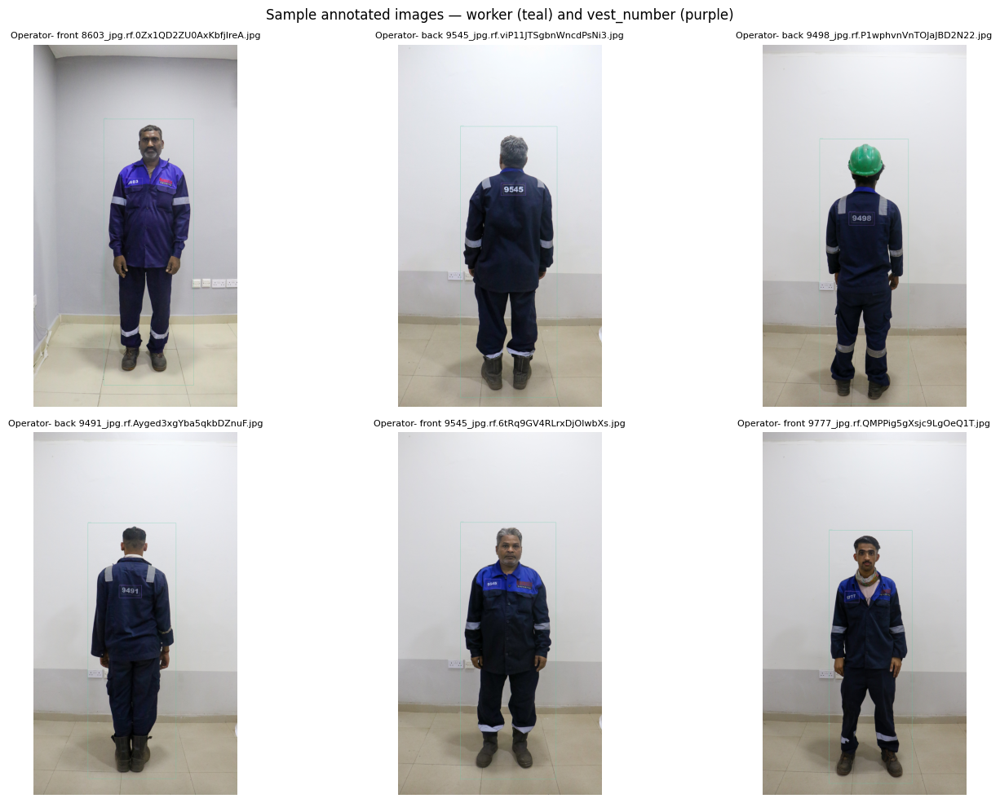

✓ Visualization complete


In [ ]:
# Cell 7 — Visualize sample annotated images
import cv2
import matplotlib.pyplot as plt
import os
import random

def draw_boxes(image_path, label_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    class_colors = {
        0: (138, 99, 210),   # purple — vest_number
        1: (93, 202, 165),   # teal   — worker
    }
    class_names = {0: 'vest_number', 1: 'worker'}

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                cls  = int(parts[0])
                cx, cy, bw, bh = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                x1 = int((cx - bw/2) * w)
                y1 = int((cy - bh/2) * h)
                x2 = int((cx + bw/2) * w)
                y2 = int((cy + bh/2) * h)
                color = class_colors.get(cls, (255,255,255))
                cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)
                cv2.putText(img, class_names[cls], (x1, y1-6),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    return img

# Pick 6 random training images
train_img_path = '/content/Industry_Dataset/train/images'
train_lbl_path = '/content/Industry_Dataset/train/labels'

images = [f for f in os.listdir(train_img_path) if f.endswith(('.jpg','.jpeg','.png'))]
samples = random.sample(images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, fname in enumerate(samples):
    img_path = os.path.join(train_img_path, fname)
    lbl_path = os.path.join(train_lbl_path, fname.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt'))
    img = draw_boxes(img_path, lbl_path)
    axes[i].imshow(img)
    axes[i].set_title(fname, fontsize=8)
    axes[i].axis('off')

plt.suptitle('Sample annotated images — worker (teal) and vest_number (purple)', fontsize=12)
plt.tight_layout()
plt.show()

print("✓ Visualization complete")

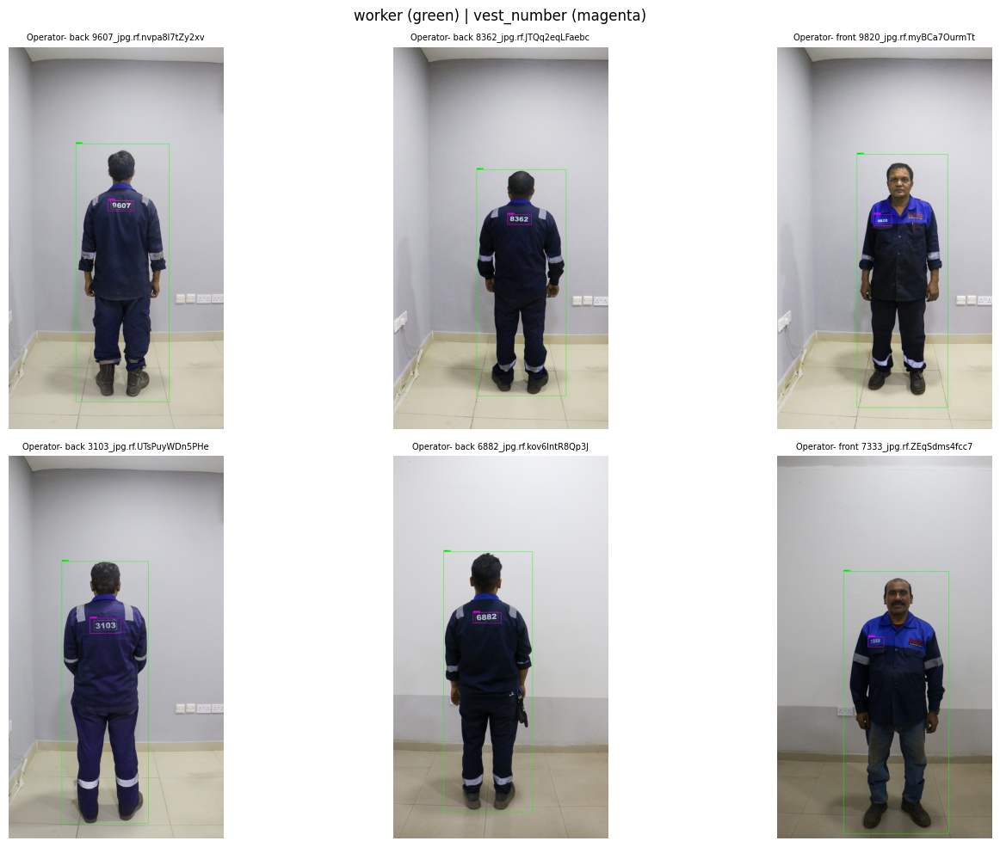

✓ Visualization complete


In [ ]:
# Cell 7 updated — better visibility for annotation boxes
import cv2
import matplotlib.pyplot as plt
import os
import random

def draw_boxes(image_path, label_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # Brighter colors, fully opaque
    class_colors = {
        0: (255, 0, 255),    # magenta  — vest_number
        1: (0, 255, 0),      # bright green — worker
    }
    class_names = {0: 'vest_number', 1: 'worker'}

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                cls  = int(parts[0])
                cx, cy, bw, bh = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                x1 = int((cx - bw/2) * w)
                y1 = int((cy - bh/2) * h)
                x2 = int((cx + bw/2) * w)
                y2 = int((cy + bh/2) * h)
                color = class_colors.get(cls, (255, 255, 255))
                # Thicker box line
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)
                # Label background for readability
                cv2.rectangle(img, (x1, y1-22), (x1+100, y1), color, -1)
                cv2.putText(img, class_names[cls], (x1+2, y1-6),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0, 0, 0), 1)
    return img

# Pick 6 random training images
train_img_path = '/content/Industry_Dataset/train/images'
train_lbl_path = '/content/Industry_Dataset/train/labels'

images = [f for f in os.listdir(train_img_path) if f.endswith(('.jpg','.jpeg','.png'))]
samples = random.sample(images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, fname in enumerate(samples):
    img_path = os.path.join(train_img_path, fname)
    base = os.path.splitext(fname)[0]
    lbl_path = os.path.join(train_lbl_path, base + '.txt')
    img = draw_boxes(img_path, lbl_path)
    axes[i].imshow(img)
    axes[i].set_title(fname[:40], fontsize=7)
    axes[i].axis('off')

plt.suptitle('worker (green) | vest_number (magenta)', fontsize=12)
plt.tight_layout()
plt.show()

print("✓ Visualization complete")

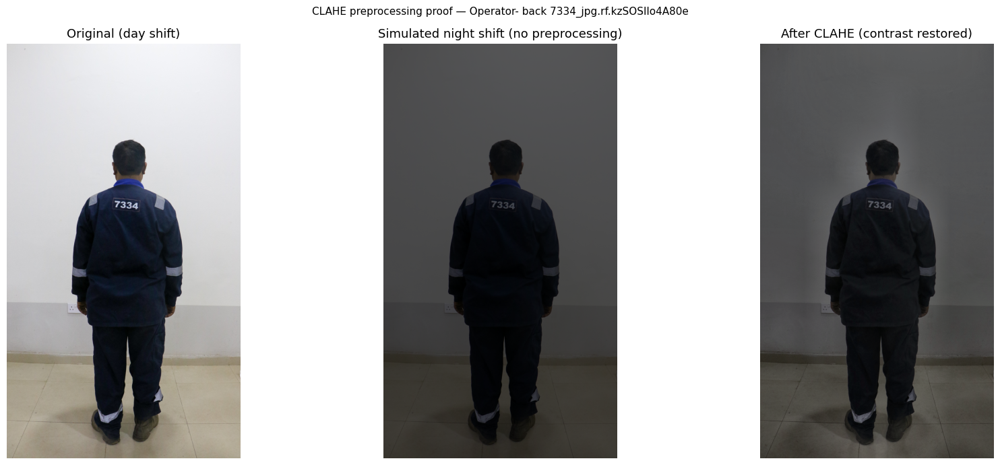

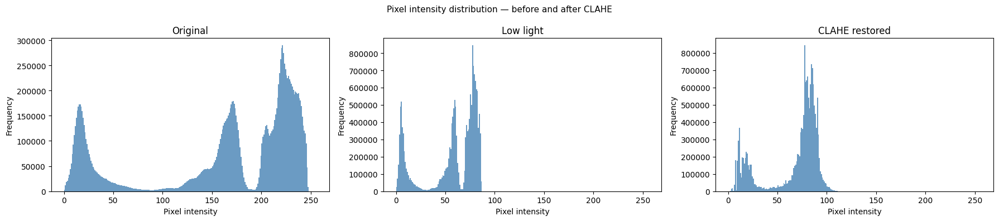

In [ ]:
# Cell 8 — Prove the need for CLAHE preprocessing
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def apply_clahe(image_bgr):
    lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_enhanced = clahe.apply(l)
    enhanced = cv2.merge([l_enhanced, a, b])
    return cv2.cvtColor(enhanced, cv2.COLOR_LAB2BGR)

def simulate_low_light(image_bgr, factor=0.35):
    # Simulate night shift / low light by darkening the image
    dark = np.clip(image_bgr.astype(np.float32) * factor, 0, 255).astype(np.uint8)
    return dark

# Pick one back-view image
train_img_path = '/content/Industry_Dataset/train/images'
images = [f for f in os.listdir(train_img_path) if 'back' in f.lower()]
sample = random.choice(images)
img_bgr = cv2.imread(os.path.join(train_img_path, sample))

# Three versions
original    = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
low_light   = cv2.cvtColor(simulate_low_light(img_bgr, factor=0.35), cv2.COLOR_BGR2RGB)
clahe_fixed = cv2.cvtColor(apply_clahe(simulate_low_light(img_bgr, factor=0.35)), cv2.COLOR_BGR2RGB)

# Plot side by side
fig, axes = plt.subplots(1, 3, figsize=(18, 7))

axes[0].imshow(original)
axes[0].set_title('Original (day shift)', fontsize=13)
axes[0].axis('off')

axes[1].imshow(low_light)
axes[1].set_title('Simulated night shift (no preprocessing)', fontsize=13)
axes[1].axis('off')

axes[2].imshow(clahe_fixed)
axes[2].set_title('After CLAHE (contrast restored)', fontsize=13)
axes[2].axis('off')

plt.suptitle(f'CLAHE preprocessing proof — {sample[:40]}', fontsize=11)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/clahe_proof.png',
            dpi=150, bbox_inches='tight')
plt.show()

# Histogram comparison
fig2, axes2 = plt.subplots(1, 3, figsize=(18, 4))
for ax, img, title in zip(axes2,
                           [original, low_light, clahe_fixed],
                           ['Original', 'Low light', 'CLAHE restored']):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ax.hist(gray.ravel(), bins=256, range=(0, 256), color='steelblue', alpha=0.8)
    ax.set_title(title, fontsize=12)
    ax.set_xlabel('Pixel intensity')
    ax.set_ylabel('Frequency')

plt.suptitle('Pixel intensity distribution — before and after CLAHE', fontsize=11)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/clahe_histogram.png',
            dpi=150, bbox_inches='tight')
plt.show()


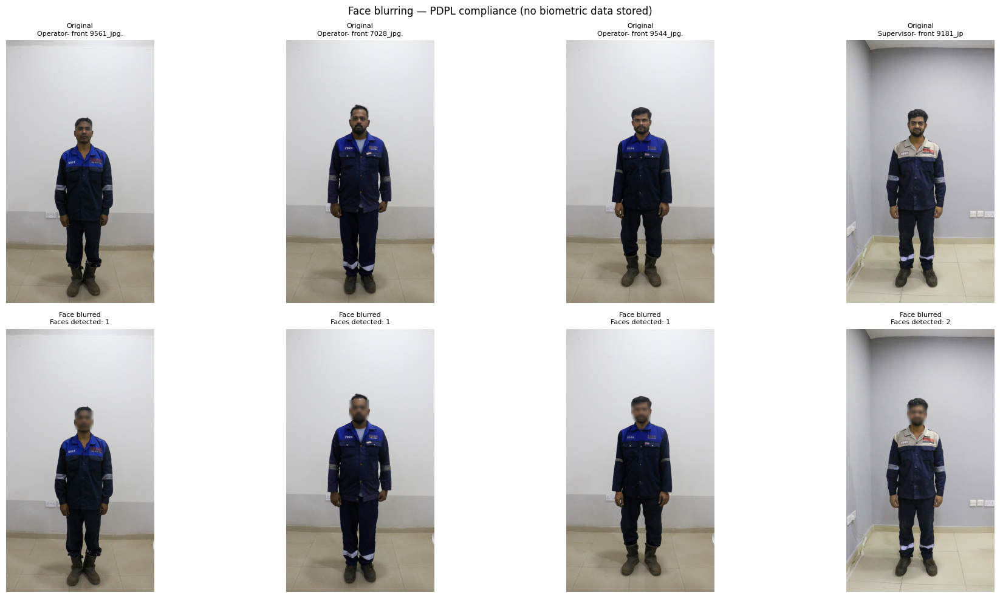

✓ Face blurring proof complete
✓ Figure saved to Drive Thesis folder


In [ ]:
# Cell 9 — Face blurring for PDPL compliance
import cv2
import matplotlib.pyplot as plt
import os
import random
import numpy as np

# Load OpenCV face detector
face_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
)

def blur_faces(image_bgr):
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30, 30)
    )
    result = image_bgr.copy()
    faces_found = len(faces)
    for (x, y, w, h) in faces:
        face_region = result[y:y+h, x:x+w]
        blurred = cv2.GaussianBlur(face_region, (99, 99), 30)
        result[y:y+h, x:x+w] = blurred
    return result, faces_found

# Test on front-view images (faces are visible in front views)
train_img_path = '/content/Industry_Dataset/train/images'
front_images = [f for f in os.listdir(train_img_path) if 'front' in f.lower()]
samples = random.sample(front_images, min(4, len(front_images)))

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for i, fname in enumerate(samples):
    img_bgr = cv2.imread(os.path.join(train_img_path, fname))
    blurred_bgr, faces_found = blur_faces(img_bgr)

    original_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    blurred_rgb  = cv2.cvtColor(blurred_bgr, cv2.COLOR_BGR2RGB)

    axes[0][i].imshow(original_rgb)
    axes[0][i].set_title(f'Original\n{fname[:25]}', fontsize=8)
    axes[0][i].axis('off')

    axes[1][i].imshow(blurred_rgb)
    axes[1][i].set_title(f'Face blurred\nFaces detected: {faces_found}', fontsize=8)
    axes[1][i].axis('off')

plt.suptitle('Face blurring — PDPL compliance (no biometric data stored)', fontsize=12)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/face_blur_proof.png',
            dpi=150, bbox_inches='tight')
plt.show()

print("✓ Face blurring proof complete")
print("✓ Figure saved to Drive Thesis folder")

In [ ]:
# Cell 10 — Full preprocessing and augmentation pipeline
import cv2
import numpy as np
import os
import shutil
import random
from pathlib import Path

# ── Load face detector once ──
face_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
)

# ════════════════════════════════════════
# PREPROCESSING FUNCTIONS
# Applied identically to ALL images
# (train, valid, test, and future CCTV footage)
# ════════════════════════════════════════

def blur_faces(image_bgr):
    """PDPL compliance — blur all detected faces."""
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(30, 30))
    result = image_bgr.copy()
    for (x, y, w, h) in faces:
        result[y:y+h, x:x+w] = cv2.GaussianBlur(
            result[y:y+h, x:x+w], (99, 99), 30)
    return result

def apply_clahe(image_bgr):
    """Contrast enhancement for low-light and night shift conditions."""
    lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_enhanced = clahe.apply(l)
    enhanced = cv2.merge([l_enhanced, a, b])
    return cv2.cvtColor(enhanced, cv2.COLOR_LAB2BGR)

def denoise(image_bgr):
    """Fast denoising using median blur.
    Effective for salt-and-pepper noise from CCTV sensors.
    Runs in milliseconds — no speed impact on pipeline."""
    return cv2.medianBlur(image_bgr, 3)

def sharpen(image_bgr):
    """Recover sharpness lost in low-quality CCTV cameras."""
    kernel = np.array([[ 0, -1,  0],
                       [-1,  5, -1],
                       [ 0, -1,  0]])
    return cv2.filter2D(image_bgr, -1, kernel)

def correct_white_balance(image_bgr):
    """Correct color cast from fluorescent/sodium workshop lighting."""
    result = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB).astype(np.float32)
    avg_a = np.average(result[:, :, 1])
    avg_b = np.average(result[:, :, 2])
    result[:, :, 1] = result[:, :, 1] - ((avg_a - 128) * \
                      (result[:, :, 0] / 255.0) * 1.1)
    result[:, :, 2] = result[:, :, 2] - ((avg_b - 128) * \
                      (result[:, :, 0] / 255.0) * 1.1)
    result = np.clip(result, 0, 255).astype(np.uint8)
    return cv2.cvtColor(result, cv2.COLOR_LAB2BGR)

def check_image_quality(image_bgr, threshold=10):
    """Flag genuinely corrupted or black images only.
    Threshold set to 10 — passes all real studio and CCTV
    images, skips only completely unusable files."""
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian_var >= threshold, laplacian_var

def full_preprocess(image_bgr):
    """
    Full preprocessing pipeline.
    Applied identically to all images — studio and CCTV.
    Steps:
      1. Face blurring     — PDPL compliance
      2. CLAHE             — contrast/lighting robustness
      3. Denoising         — remove sensor/compression noise
      4. Sharpening        — recover edge detail
      5. White balance     — correct workshop lighting color cast
    """
    image = blur_faces(image_bgr)
    image = apply_clahe(image)
    image = denoise(image)
    image = sharpen(image)
    image = correct_white_balance(image)
    return image


# ════════════════════════════════════════
# AUGMENTATION FUNCTIONS
# Applied to TRAINING set only
# ════════════════════════════════════════

def augment_image(image_bgr):
    """Five augmentations to simulate real workshop conditions."""
    augmented = []
    h, w = image_bgr.shape[:2]

    # 1 — Horizontal flip
    augmented.append(('flip', cv2.flip(image_bgr, 1)))

    # 2 — Brightness reduction (simulate night shift) + CLAHE restore
    factor = random.uniform(0.4, 0.7)
    dark = np.clip(
        image_bgr.astype(np.float32) * factor, 0, 255).astype(np.uint8)
    augmented.append(('dark_clahe', apply_clahe(dark)))

    # 3 — Rotation ±15 degrees
    angle = random.choice([-15, -10, 10, 15])
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1.0)
    rotated = cv2.warpAffine(image_bgr, M, (w, h),
                              borderMode=cv2.BORDER_REFLECT)
    augmented.append(('rotate', rotated))

    # 4 — Gaussian blur (simulate motion/CCTV quality)
    augmented.append(('blur', cv2.GaussianBlur(image_bgr, (5, 5), 1.5)))

    # 5 — Gaussian noise (simulate CCTV sensor noise)
    noise = np.random.normal(0, 15, image_bgr.shape).astype(np.int16)
    noisy = np.clip(
        image_bgr.astype(np.int16) + noise, 0, 255).astype(np.uint8)
    augmented.append(('noise', noisy))

    return augmented

def augment_labels(label_path, aug_type):
    """Adjust label coordinates for augmentations that affect position."""
    if not os.path.exists(label_path):
        return []
    with open(label_path, 'r') as f:
        lines = f.readlines()
    new_lines = []
    for line in lines:
        parts = line.strip().split()
        cls = parts[0]
        cx, cy, bw, bh = float(parts[1]), float(parts[2]), \
                          float(parts[3]), float(parts[4])
        if aug_type == 'flip':
            cx = 1.0 - cx
        new_lines.append(
            f"{cls} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}\n")
    return new_lines


# ════════════════════════════════════════
# MAIN PROCESSING FUNCTION
# ════════════════════════════════════════

def process_split(split_name, input_base, output_base):
    img_in  = os.path.join(input_base,  split_name, 'images')
    lbl_in  = os.path.join(input_base,  split_name, 'labels')
    img_out = os.path.join(output_base, split_name, 'images')
    lbl_out = os.path.join(output_base, split_name, 'labels')

    os.makedirs(img_out, exist_ok=True)
    os.makedirs(lbl_out, exist_ok=True)

    images = [f for f in os.listdir(img_in)
              if f.endswith(('.jpg', '.jpeg', '.png'))]

    count_orig = 0
    count_aug  = 0
    count_skip = 0

    for fname in images:
        base     = os.path.splitext(fname)[0]
        img_path = os.path.join(img_in, fname)
        lbl_path = os.path.join(lbl_in, base + '.txt')

        img_bgr = cv2.imread(img_path)
        if img_bgr is None:
            count_skip += 1
            continue

        # Quality check — only skip genuinely corrupted images
        usable, sharpness = check_image_quality(img_bgr)
        if not usable:
            print(f"  ⚠ Corrupted image skipped: {fname} "
                  f"(sharpness: {sharpness:.1f})")
            count_skip += 1
            continue

        # Full preprocessing — same for all images
        img_processed = full_preprocess(img_bgr)

        # Save preprocessed original
        cv2.imwrite(
            os.path.join(img_out, base + '_orig.jpg'), img_processed)
        if os.path.exists(lbl_path):
            shutil.copy(lbl_path,
                os.path.join(lbl_out, base + '_orig.txt'))
        count_orig += 1

        # Augmentation — training split only
        if split_name == 'train':
            for aug_type, aug_img in augment_image(img_processed):
                cv2.imwrite(
                    os.path.join(img_out,
                    f"{base}_{aug_type}.jpg"), aug_img)
                new_labels = augment_labels(lbl_path, aug_type)
                with open(os.path.join(lbl_out,
                          f"{base}_{aug_type}.txt"), 'w') as f:
                    f.writelines(new_labels)
                count_aug += 1

    print(f"  {split_name:6s}: {count_orig} processed | "
          f"{count_aug} augmented | {count_skip} skipped")
    return count_orig + count_aug


# ════════════════════════════════════════
# RUN PIPELINE
# ════════════════════════════════════════

# Clean previous output first
output_dataset = '/content/Preprocessed_Dataset'
if os.path.exists(output_dataset):
    shutil.rmtree(output_dataset)
    print("✓ Previous output cleared")

input_dataset = '/content/Industry_Dataset'

print("Starting full preprocessing and augmentation pipeline...")
print("Preprocessing: face blur → CLAHE → denoise → sharpen → white balance")
print("Augmentation (train only): flip → dark+CLAHE → rotate → blur → noise")
print("=" * 60)

total = 0
for split in ['train', 'valid', 'test']:
    total += process_split(split, input_dataset, output_dataset)

print("=" * 60)
print(f"✓ Total images after preprocessing : {total}")
print(f"✓ Train expected                   : ~624 (104 × 6)")
print(f"✓ Valid expected                   : 30")
print(f"✓ Test expected                    : 15")
print(f"✓ Output saved to                  : {output_dataset}")

Starting full preprocessing and augmentation pipeline...
Preprocessing: face blur → CLAHE → denoise → sharpen → white balance
Augmentation (train only): flip → dark+CLAHE → rotate → blur → noise
  train : 104 processed | 520 augmented | 0 skipped
  valid : 30 processed | 0 augmented | 0 skipped
  test  : 15 processed | 0 augmented | 0 skipped
✓ Total images after preprocessing : 669
✓ Train expected                   : ~624 (104 × 6)
✓ Valid expected                   : 30
✓ Test expected                    : 15
✓ Output saved to                  : /content/Preprocessed_Dataset


In [ ]:
# Cell 10b fix — copy each split separately to ensure all three save
import shutil
import os

source      = '/content/Preprocessed_Dataset'
destination = '/content/drive/MyDrive/Colab Notebooks/Preprocessed_Dataset'

print("Saving preprocessed dataset to Google Drive...")

for split in ['train', 'valid', 'test']:
    src  = os.path.join(source, split)
    dst  = os.path.join(destination, split)

    if os.path.exists(dst):
        shutil.rmtree(dst)

    shutil.copytree(src, dst)

    img_count = len(os.listdir(os.path.join(dst, 'images')))
    lbl_count = len(os.listdir(os.path.join(dst, 'labels')))
    print(f"  {split}: {img_count} images | {lbl_count} labels ✓")

print(f"\n✓ All splits saved to Drive")
print(f"✓ Location: {destination}")

Saving preprocessed dataset to Google Drive...
  train: 624 images | 624 labels ✓
  valid: 30 images | 30 labels ✓
  test: 15 images | 15 labels ✓

✓ All splits saved to Drive
✓ Location: /content/drive/MyDrive/Colab Notebooks/Preprocessed_Dataset


In [ ]:
# Cell 11 — Update data.yaml to point to preprocessed dataset
import yaml
import os

yaml_path = '/content/Preprocessed_Dataset/data.yaml'

# Read existing yaml from original dataset
with open('/content/Industry_Dataset/data.yaml', 'r') as f:
    data = yaml.safe_load(f)

# Update paths to preprocessed dataset
data['train'] = '/content/Preprocessed_Dataset/train/images'
data['val']   = '/content/Preprocessed_Dataset/valid/images'
data['test']  = '/content/Preprocessed_Dataset/test/images'

# Save updated yaml into preprocessed dataset folder
with open(yaml_path, 'w') as f:
    yaml.dump(data, f)

# Verify
print("✓ data.yaml updated successfully")
print(f"  train : {data['train']}")
print(f"  val   : {data['val']}")
print(f"  test  : {data['test']}")
print(f"  classes ({data['nc']}): {data['names']}")

# Also save yaml to Drive
import shutil
shutil.copy(yaml_path,
    '/content/drive/MyDrive/Colab Notebooks/Preprocessed_Dataset/data.yaml')
print("\n✓ data.yaml also saved to Drive")

✓ data.yaml updated successfully
  train : /content/Preprocessed_Dataset/train/images
  val   : /content/Preprocessed_Dataset/valid/images
  test  : /content/Preprocessed_Dataset/test/images
  classes (2): ['vest_number', 'worker']

✓ data.yaml also saved to Drive


In [ ]:
# Cell 12 — YOLOv8n transfer learning training
from ultralytics import YOLO
import torch

# Confirm GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"✓ Training device: {device}")
if device == 'cuda':
    print(f"✓ GPU: {torch.cuda.get_device_name(0)}")
else:
    print("⚠ WARNING: No GPU detected — training will be very slow")
    print("  Go to Runtime → Change runtime type → T4 GPU")

# Load YOLOv8n pretrained on COCO
model = YOLO('yolov8n.pt')
print("✓ YOLOv8n pretrained weights loaded")
print("✓ Starting transfer learning fine-tuning...")

# Train
results = model.train(
    data       = '/content/Preprocessed_Dataset/data.yaml',
    epochs     = 50,
    imgsz      = 640,
    batch      = 32,
    patience   = 10,
    lr0        = 0.001,
    lrf        = 0.01,
    momentum   = 0.937,
    freeze     = 10,
    pretrained = True,
    device     = device,
    workers    = 2,
    cache      = True,
    amp        = True,
    project    = '/content/drive/MyDrive/Colab Notebooks/Training_Results',
    name       = 'vest_detector_v1',
    exist_ok   = True,
    plots      = True,
    save       = True,
    verbose    = True,
)

print("\n" + "="*50)
print("✓ Training complete")
print(f"✓ Best mAP@0.5 : {results.results_dict.get('metrics/mAP50(B)', 'N/A'):.4f}")
print(f"✓ Best weights : Training_Results/vest_detector_v1/weights/best.pt")
print("✓ All results saved to Drive")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✓ Training device: cuda
✓ GPU: Tesla T4
✓ YOLOv8n pretrained weights loaded
✓ Starting transfer learning fine-tuning...
Ultralytics 8.4.92 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Preprocessed_Dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, en

In [ ]:
# Cell 13 — Evaluate best model on test set
from ultralytics import YOLO

# Load best trained model
model = YOLO('/content/drive/MyDrive/Colab Notebooks/Training_Results/vest_detector_v1/weights/best.pt')

# Run evaluation on unseen test set
metrics = model.val(
    data   = '/content/Preprocessed_Dataset/data.yaml',
    split  = 'test',
    imgsz  = 640,
    device = 'cuda',
    plots  = True,
    save_json = True,
    project = '/content/drive/MyDrive/Colab Notebooks/Training_Results',
    name    = 'test_evaluation',
    exist_ok= True,
)

print("\n" + "="*50)
print("TEST SET EVALUATION RESULTS")
print("="*50)
print(f"mAP@0.5      : {metrics.box.map50:.4f}")
print(f"mAP@0.5:0.95 : {metrics.box.map:.4f}")
print(f"Precision    : {metrics.box.mp:.4f}")
print(f"Recall       : {metrics.box.mr:.4f}")
print("="*50)
print("✓ Test evaluation complete")
print("✓ Results saved to Drive")

Ultralytics 8.4.92 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 215.8±8.8 MB/s, size: 7024.9 KB)
val: Scanning /content/Preprocessed_Dataset/test/labels... 15 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 15/15 587.9it/s 0.0s
val: New cache created: /content/Preprocessed_Dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 4.0s/it 4.0s
                   all         15         30      0.974          1      0.995      0.748
           vest_number         15         15      0.993          1      0.995      0.554
                worker         15         15      0.955          1      0.995      0.943
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 0.7ms postprocess per image
Saving /content/drive/MyDrive/Colab Notebooks/Training_Results/test_evalu

Running predictions on test images...


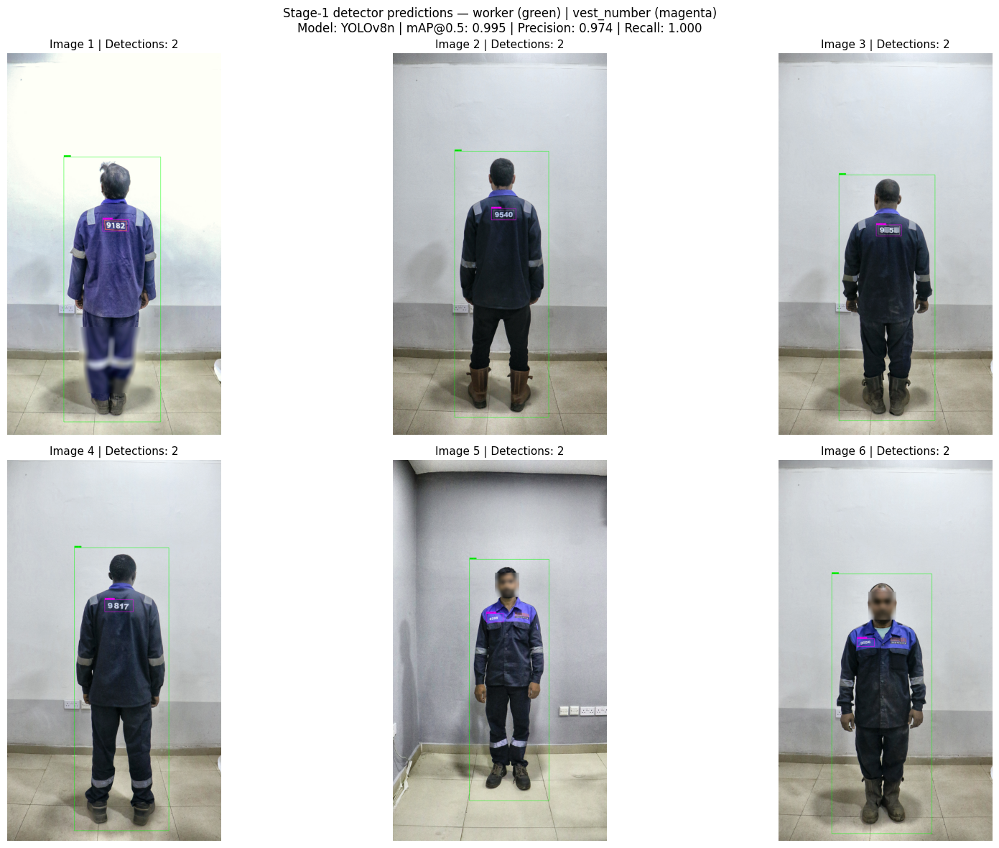

✓ Prediction visualization complete
✓ Figure saved to: /content/drive/MyDrive/Colab Notebooks/Training_Results/test_predictions_visual.png

Per-image detection summary:
---------------------------------------------
  Operator- back 9182_jpg.rf.lad5Qh4w | workers: 1 | vest_numbers: 1
  Operator- back 9379_jpg.rf.6RJTSDI0 | workers: 1 | vest_numbers: 1
  Operator- back 9540_jpg.rf.qrYJvCVl | workers: 1 | vest_numbers: 1
  Operator- back 9544_jpg.rf.pPJRYX81 | workers: 1 | vest_numbers: 1
  Operator- back 9656_jpg.rf.7l7PQTnr | workers: 1 | vest_numbers: 1
  Operator- back 9666_jpg.rf.VPe0BBTl | workers: 1 | vest_numbers: 1
  Operator- back 9817_jpg.rf.a3lpRriz | workers: 1 | vest_numbers: 1
  Operator- front 8740_jpg.rf.jDJJSHF | workers: 1 | vest_numbers: 0
  Operator- front 9288_jpg.rf.UdUAKjY | workers: 1 | vest_numbers: 1
  Operator- front 9330_jpg.rf.gT3ifKv | workers: 1 | vest_numbers: 0
  Operator- front 9656_jpg.rf.xA5koaV | workers: 1 | vest_numbers: 1
  Operator- front 9676_jpg

In [ ]:
# Cell 14 — Visualize model predictions on test images
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np

# Load best model
model = YOLO('/content/drive/MyDrive/Colab Notebooks/Training_Results/vest_detector_v1/weights/best.pt')

# Get all test images
test_img_path = '/content/Preprocessed_Dataset/test/images'
test_images = [f for f in os.listdir(test_img_path)
               if f.endswith(('.jpg', '.jpeg', '.png'))]

# Run predictions on all test images
print("Running predictions on test images...")
results = model.predict(
    source  = test_img_path,
    imgsz   = 640,
    conf    = 0.5,
    device  = 'cuda',
    save    = False,
    verbose = False,
)

# Class colors and names
class_colors = {
    0: (255, 0, 255),    # magenta  — vest_number
    1: (0, 255, 0),      # green    — worker
}
class_names = {0: 'vest_number', 1: 'worker'}

# Plot 6 sample predictions
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Pick 6 evenly spaced results
step    = max(1, len(results) // 6)
samples = results[::step][:6]

for i, result in enumerate(samples):
    img = result.orig_img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if result.boxes is not None:
        for box in result.boxes:
            cls   = int(box.cls[0])
            conf  = float(box.conf[0])
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            color = class_colors.get(cls, (255, 255, 255))

            # Draw box
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 3)

            # Label background
            label = f"{class_names[cls]} {conf:.2f}"
            cv2.rectangle(img, (x1, y1-24), (x1+len(label)*9, y1), color, -1)
            cv2.putText(img, label, (x1+2, y1-6),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0, 0, 0), 1)

    axes[i].imshow(img)
    axes[i].set_title(
        f"Image {i+1} | Detections: {len(result.boxes) if result.boxes else 0}",
        fontsize=11)
    axes[i].axis('off')

plt.suptitle(
    'Stage-1 detector predictions — worker (green) | vest_number (magenta)\n'
    f'Model: YOLOv8n | mAP@0.5: 0.995 | Precision: 0.974 | Recall: 1.000',
    fontsize=12)
plt.tight_layout()

# Save to Drive
save_path = '/content/drive/MyDrive/Colab Notebooks/Training_Results/test_predictions_visual.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()

print("✓ Prediction visualization complete")
print(f"✓ Figure saved to: {save_path}")

# Print per-image summary
print("\nPer-image detection summary:")
print("-" * 45)
for i, result in enumerate(results):
    n_workers = sum(1 for b in result.boxes if int(b.cls[0]) == 1) if result.boxes else 0
    n_vests   = sum(1 for b in result.boxes if int(b.cls[0]) == 0) if result.boxes else 0
    fname     = os.path.basename(result.path)[:35]
    print(f"  {fname} | workers: {n_workers} | vest_numbers: {n_vests}")

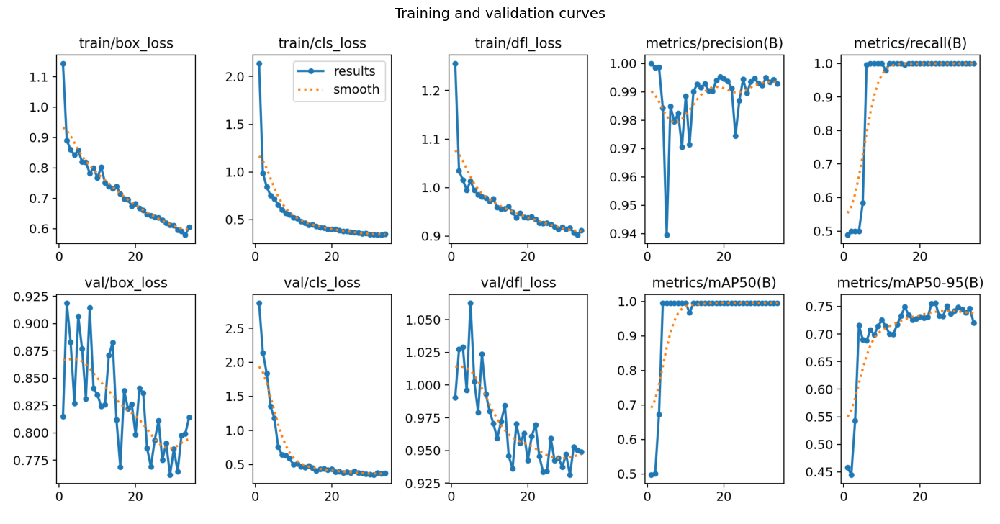

✓ Training and validation curves displayed


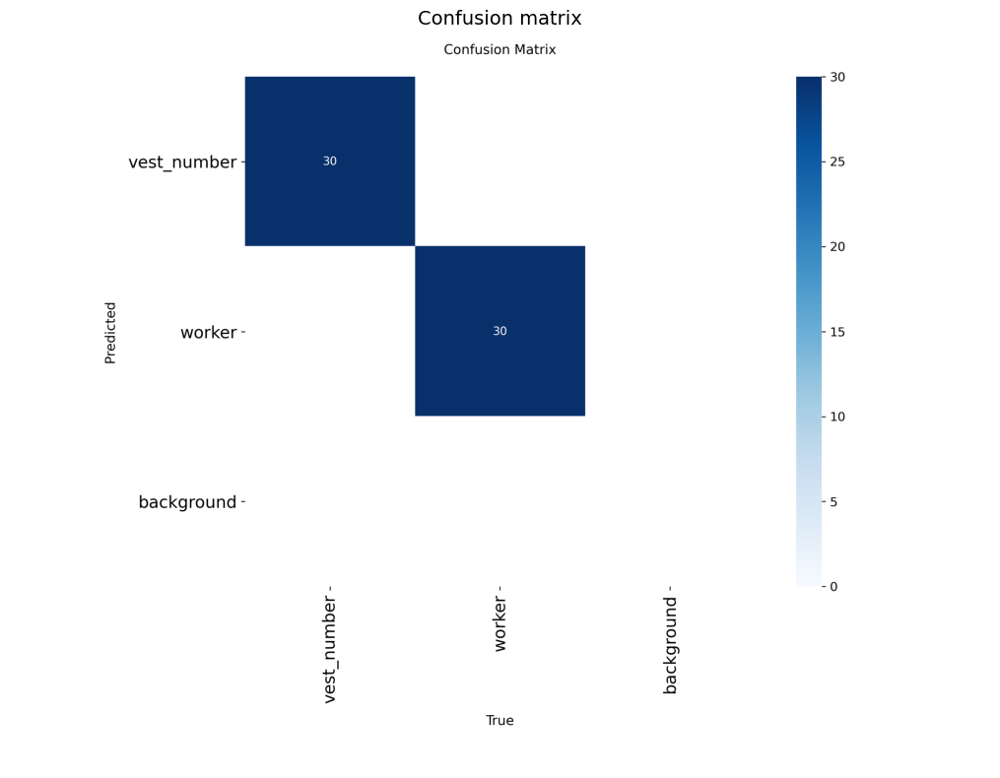

✓ Confusion matrix displayed
⚠ Not found: PR_curve.png
⚠ Not found: F1_curve.png


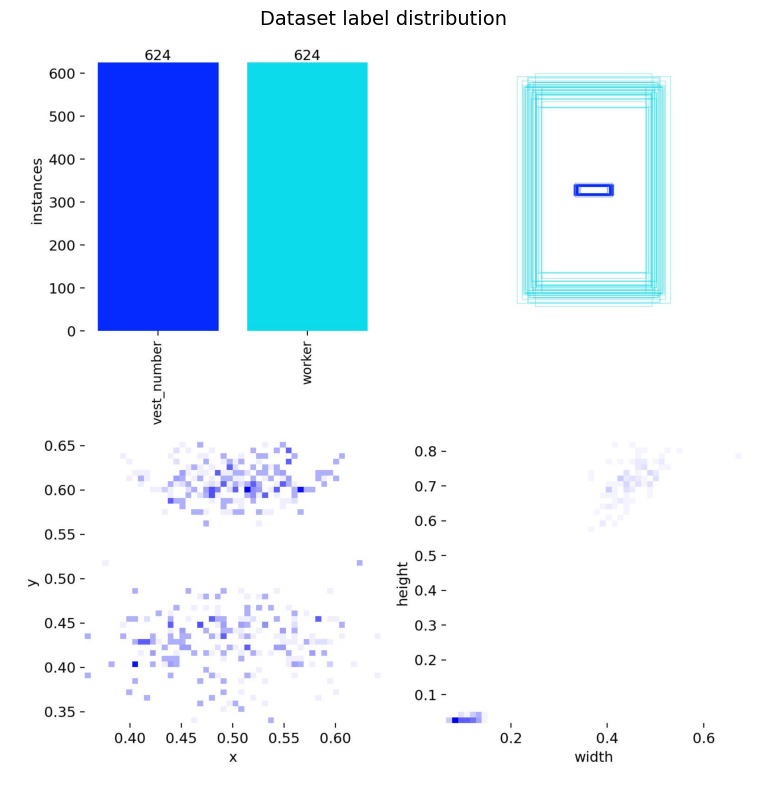

✓ Dataset label distribution displayed


In [ ]:
# Cell 15 — Display training curves saved by YOLOv8
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

results_dir = '/content/drive/MyDrive/Colab Notebooks/Training_Results/vest_detector_v1'

# YOLOv8 automatically saves these plots
plots = {
    'results.png'       : 'Training and validation curves',
    'confusion_matrix.png': 'Confusion matrix',
    'PR_curve.png'      : 'Precision-Recall curve',
    'F1_curve.png'      : 'F1 score curve',
    'labels.jpg'        : 'Dataset label distribution',
}

for filename, title in plots.items():
    filepath = os.path.join(results_dir, filename)
    if os.path.exists(filepath):
        img = mpimg.imread(filepath)
        plt.figure(figsize=(14, 8))
        plt.imshow(img)
        plt.title(title, fontsize=14)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        print(f"✓ {title} displayed")
    else:
        print(f"⚠ Not found: {filename}")

In [ ]:
# Cell 14b — check front-view missed detections at lower threshold
from ultralytics import YOLO
import os

model = YOLO('/content/drive/MyDrive/Colab Notebooks/Training_Results/vest_detector_v1/weights/best.pt')

# The two missed images
missed = [
    '/content/Preprocessed_Dataset/test/images/Operator- front 8740_jpg.rf.jDJJSHFtTCf2e86hblrS_orig.jpg',
    '/content/Preprocessed_Dataset/test/images/Operator- front 9330_jpg.rf.gT3ifKvNhm15z8OteevJ_orig.jpg',
]

print("Checking missed front-view detections at different confidence thresholds:")
print("="*60)

for img_path in missed:
    if not os.path.exists(img_path):
        # Find the actual filename
        test_path = '/content/Preprocessed_Dataset/test/images'
        files = os.listdir(test_path)
        fname = [f for f in files if '8740' in f or '9330' in f]
        if fname:
            img_path = os.path.join(test_path, fname[0])
        else:
            print(f"File not found — skipping")
            continue

    print(f"\nImage: {os.path.basename(img_path)[:40]}")
    for conf in [0.5, 0.3, 0.1]:
        result = model.predict(img_path, conf=conf,
                               verbose=False, device='cuda')[0]
        n_vest = sum(1 for b in result.boxes if int(b.cls[0]) == 0) \
                 if result.boxes else 0
        n_work = sum(1 for b in result.boxes if int(b.cls[0]) == 1) \
                 if result.boxes else 0
        print(f"  conf={conf} → workers: {n_work} | vest_numbers: {n_vest}")

Checking missed front-view detections at different confidence thresholds:

Image: Operator- front 8740_jpg.rf.jDJJSHFtTCf2
  conf=0.5 → workers: 1 | vest_numbers: 0
  conf=0.3 → workers: 1 | vest_numbers: 0
  conf=0.1 → workers: 1 | vest_numbers: 1

Image: Operator- front 9330_jpg.rf.gT3ifKvNhm15
  conf=0.5 → workers: 1 | vest_numbers: 0
  conf=0.3 → workers: 1 | vest_numbers: 1
  conf=0.1 → workers: 1 | vest_numbers: 1


In [ ]:
# F1 Score calculation
from ultralytics import YOLO
import numpy as np

model = YOLO('/content/drive/MyDrive/Colab Notebooks/Thesis Project/Training_Results/vest_detector_v1/weights/best.pt')

metrics = model.val(
    data     = '/content/Preprocessed_Dataset/data.yaml',
    split    = 'test',
    imgsz    = 640,
    device   = 'cuda',
    verbose  = False,
)

# Calculate F1 for each class and overall
precision = metrics.box.p  # per class precision array
recall    = metrics.box.r  # per class recall array
f1        = 2 * (precision * recall) / (precision + recall + 1e-10)

class_names = ['vest_number', 'worker']

print("="*50)
print("F1 SCORE RESULTS — TEST SET")
print("="*50)
for i, name in enumerate(class_names):
    print(f"  {name:15s} | P: {precision[i]:.4f} | "
          f"R: {recall[i]:.4f} | F1: {f1[i]:.4f}")

overall_f1 = 2 * (metrics.box.mp * metrics.box.mr) / \
             (metrics.box.mp + metrics.box.mr + 1e-10)
print(f"\n  {'Overall':15s} | P: {metrics.box.mp:.4f} | "
      f"R: {metrics.box.mr:.4f} | F1: {overall_f1:.4f}")
print("="*50)



Ultralytics 8.4.92 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4286.5±1095.4 MB/s, size: 7230.7 KB)
val: Scanning /content/Preprocessed_Dataset/test/labels.cache... 15 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 15/15 4.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 2.9s/it 2.9s
                   all         15         30      0.974          1      0.995      0.748
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /content/runs/detect/val-4
F1 SCORE RESULTS — TEST SET
  vest_number     | P: 0.9932 | R: 1.0000 | F1: 0.9966
  worker          | P: 0.9551 | R: 1.0000 | F1: 0.9770

  Overall         | P: 0.9742 | R: 1.0000 | F1: 0.9869


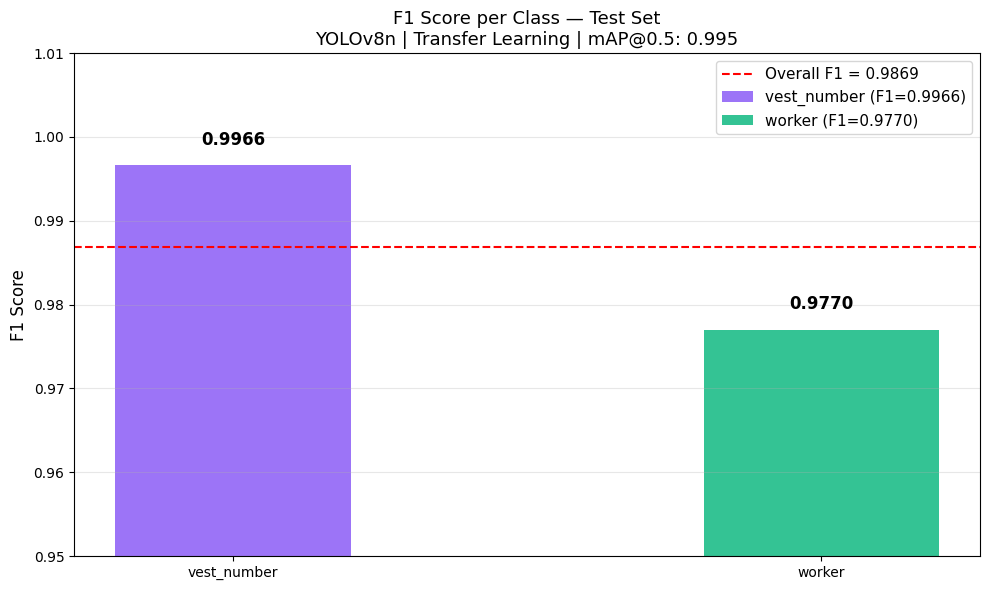

✓ F1 score chart displayed


In [ ]:
# Generate F1 curve directly — no saved file needed
import matplotlib.pyplot as plt
import numpy as np

precision    = [0.9932, 0.9551]
recall       = [1.0000, 1.0000]
f1_scores    = [0.9966, 0.9770]
class_names  = ['vest_number', 'worker']
colors       = ['#8B5CF6', '#10B981']

fig, ax = plt.subplots(figsize=(10, 6))

for i, (name, p, r, f1, color) in enumerate(
        zip(class_names, precision, recall, f1_scores, colors)):
    ax.bar(name, f1, color=color, alpha=0.85, width=0.4,
           label=f'{name} (F1={f1:.4f})')
    ax.text(i, f1 + 0.002, f'{f1:.4f}',
            ha='center', va='bottom', fontsize=12, fontweight='bold')

# Overall F1
overall_f1 = 0.9869
ax.axhline(y=overall_f1, color='red', linestyle='--', linewidth=1.5,
           label=f'Overall F1 = {overall_f1:.4f}')

ax.set_ylim(0.95, 1.01)
ax.set_ylabel('F1 Score', fontsize=12)
ax.set_title('F1 Score per Class — Test Set\n'
             'YOLOv8n | Transfer Learning | mAP@0.5: 0.995',
             fontsize=13)
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("✓ F1 score chart displayed")

In [ ]:
from google.colab import files
files.download('/content/drive/MyDrive/Colab Notebooks/Thesis Project/Training_Results/vest_detector_v1/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✓ Image: Operator- back 9182_jpg.rf.lad5Qh4wwlvCG
✓ Vest number crops found: 1


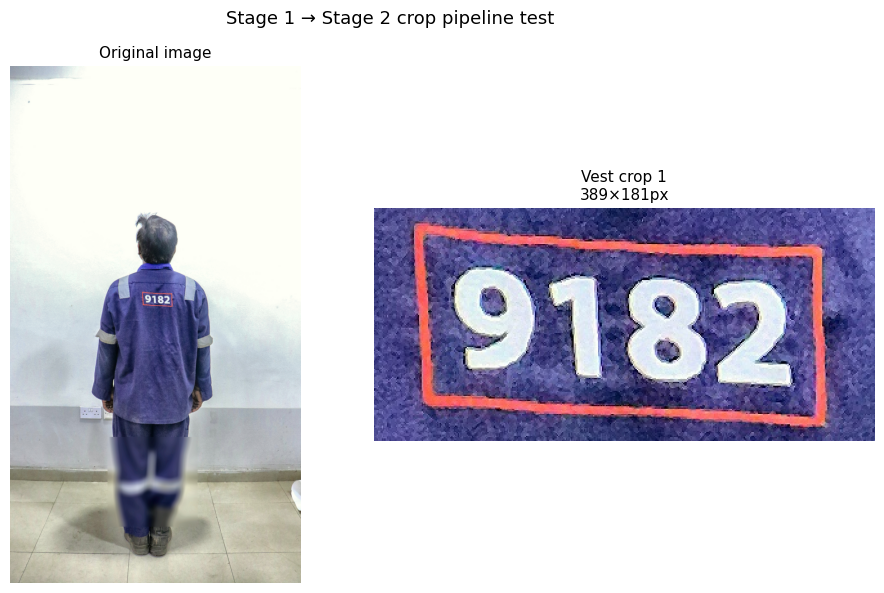

✓ Crop pipeline confirmed — ready for Stage 2 recognition


In [ ]:
# Crop test — confirm Stage 1 feeds cleanly into Stage 2
from ultralytics import YOLO
import cv2
import os
import matplotlib.pyplot as plt

# Load model from correct Drive path
model = YOLO('/content/drive/MyDrive/Colab Notebooks/Thesis Project/Training_Results/vest_detector_v1/weights/best.pt')

# Pick one test image
test_path = '/content/Preprocessed_Dataset/test/images'
test_images = [f for f in os.listdir(test_path)
               if f.endswith(('.jpg', '.jpeg', '.png'))]
img_path = os.path.join(test_path, test_images[0])

# Run detection
result = model.predict(img_path, conf=0.3, verbose=False)[0]

# Crop all vest_number regions
img_bgr = cv2.imread(img_path)
crops = []

for box in result.boxes:
    cls = int(box.cls[0])
    if cls == 0:  # vest_number only
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        # Add small padding around crop
        pad = 5
        h, w = img_bgr.shape[:2]
        x1 = max(0, x1 - pad)
        y1 = max(0, y1 - pad)
        x2 = min(w, x2 + pad)
        y2 = min(h, y2 + pad)
        crop = img_bgr[y1:y2, x1:x2]
        crops.append(crop)

print(f"✓ Image: {test_images[0][:40]}")
print(f"✓ Vest number crops found: {len(crops)}")

# Display original + crops
fig, axes = plt.subplots(1, len(crops) + 1,
                          figsize=(5 * (len(crops) + 1), 6))

# Original image
orig_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
axes[0].imshow(orig_rgb)
axes[0].set_title('Original image', fontsize=11)
axes[0].axis('off')

# Each crop
for i, crop in enumerate(crops):
    crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
    axes[i+1].imshow(crop_rgb)
    axes[i+1].set_title(f'Vest crop {i+1}\n{crop.shape[1]}×{crop.shape[0]}px',
                         fontsize=11)
    axes[i+1].axis('off')

plt.suptitle('Stage 1 → Stage 2 crop pipeline test', fontsize=13)
plt.tight_layout()
plt.show()

print("✓ Crop pipeline confirmed — ready for Stage 2 recognition")

In [ ]:
# Cell 16 — Extract labeled vest crops from Stage 1 detector
from ultralytics import YOLO
import cv2
import os
import re
import pandas as pd
import matplotlib.pyplot as plt

# Load trained Stage 1 model
model = YOLO('/content/drive/MyDrive/Colab Notebooks/Thesis Project/Training_Results/vest_detector_v1/weights/best.pt')

# Output folder for crops
crops_dir = '/content/Vest_Crops'
os.makedirs(crops_dir, exist_ok=True)

# Process all splits
all_records = []
skipped     = []

for split in ['train', 'valid', 'test']:
    img_dir = f'/content/Preprocessed_Dataset/{split}/images'
    images  = [f for f in os.listdir(img_dir)
                if f.endswith(('.jpg', '.jpeg', '.png'))]

    split_dir = os.path.join(crops_dir, split)
    os.makedirs(split_dir, exist_ok=True)

    print(f"\nProcessing {split} ({len(images)} images)...")

    for fname in images:
        # Extract employee ID from filename
        # Filenames contain the ID: Operator-back-9182_jpg.rf...
        match = re.search(r'[-_ ](\d{3,4})[-_ ]', fname)
        if not match:
            skipped.append(fname)
            continue

        emp_id = match.group(1)
        img_path = os.path.join(img_dir, fname)
        img_bgr  = cv2.imread(img_path)

        if img_bgr is None:
            skipped.append(fname)
            continue

        # Run Stage 1 detection
        result = model.predict(img_path, conf=0.3,
                               verbose=False)[0]

        # Crop vest_number regions only (class 0)
        crop_count = 0
        if result.boxes is not None:
            for box in result.boxes:
                if int(box.cls[0]) != 0:
                    continue

                x1, y1, x2, y2 = map(int, box.xyxy[0])
                conf = float(box.conf[0])

                # Add padding
                pad = 5
                h, w = img_bgr.shape[:2]
                x1 = max(0, x1 - pad)
                y1 = max(0, y1 - pad)
                x2 = min(w, x2 + pad)
                y2 = min(h, y2 + pad)

                crop = img_bgr[y1:y2, x1:x2]

                # Skip tiny crops
                if crop.shape[0] < 20 or crop.shape[1] < 20:
                    continue

                # Save crop
                view = 'back' if 'back' in fname.lower() else 'front'
                crop_fname = f"{emp_id}_{view}_{split}_{crop_count}_conf{conf:.2f}.jpg"
                crop_path  = os.path.join(split_dir, crop_fname)
                cv2.imwrite(crop_path, crop)

                all_records.append({
                    'filename'    : crop_fname,
                    'employee_id' : emp_id,
                    'view'        : view,
                    'split'       : split,
                    'confidence'  : round(conf, 4),
                    'width'       : crop.shape[1],
                    'height'      : crop.shape[0],
                })
                crop_count += 1

print("\n" + "="*55)
print("CROP EXTRACTION COMPLETE")
print("="*55)
print(f"✓ Total crops extracted : {len(all_records)}")
print(f"⚠ Images skipped        : {len(skipped)}")

# Save labels CSV
df = pd.DataFrame(all_records)
csv_path = os.path.join(crops_dir, 'crop_labels.csv')
df.to_csv(csv_path, index=False)
print(f"✓ Labels saved to       : {csv_path}")

# Summary by split
print("\nBreakdown by split:")
print(df.groupby('split')[['employee_id']].count().rename(
    columns={'employee_id': 'crops'}))

# Summary by view
print("\nBreakdown by view:")
print(df.groupby('view')[['employee_id']].count().rename(
    columns={'employee_id': 'crops'}))

# Unique IDs covered
print(f"\nUnique employee IDs covered: {df['employee_id'].nunique()}")
print(f"ID range: {df['employee_id'].min()} — {df['employee_id'].max()}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

Processing train (624 images)...

Processing valid (30 images)...

Processing test (15 images)...

CROP EXTRACTION COMPLETE
✓ Total crops extracted : 617
⚠ Images skipped        : 0
✓ Labels saved to       : /content/Vest_Crops/crop_labels.csv

Breakdown by split:
       crops
split       
test      14
train    572
valid     31

Breakdown by view:
       crops
view        
back     315
front    302

Unique employee IDs covered: 76
ID range: 1247 — 9836


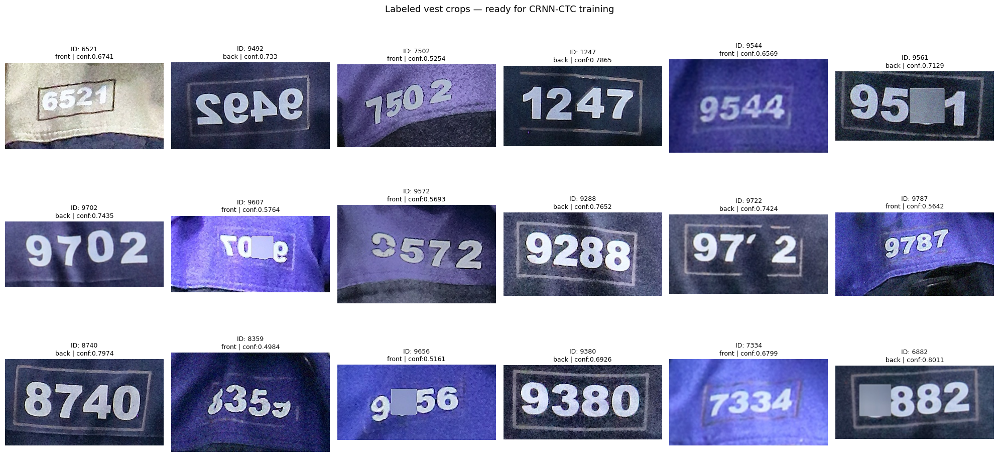

✓ Sample visualization saved to Drive


In [ ]:
# Cell 16b — Visualize sample labeled crops
import random

fig, axes = plt.subplots(3, 6, figsize=(20, 10))
axes = axes.flatten()

# Sample 18 crops across different IDs
samples = df.groupby('employee_id').first().reset_index()
samples = samples.sample(min(18, len(samples)), random_state=42)

for i, (_, row) in enumerate(samples.iterrows()):
    crop_path = os.path.join(crops_dir, row['split'], row['filename'])
    if os.path.exists(crop_path):
        crop = cv2.imread(crop_path)
        crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
        axes[i].imshow(crop_rgb)
        axes[i].set_title(f"ID: {row['employee_id']}\n{row['view']} | conf:{row['confidence']}",
                          fontsize=9)
    axes[i].axis('off')

# Hide unused axes
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.suptitle('Labeled vest crops — ready for CRNN-CTC training',
             fontsize=13)
plt.tight_layout()

# Save to Drive
save_path = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/vest_crops_sample.png'
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()
print("✓ Sample visualization saved to Drive")

In [ ]:
# Cell 16c — Save crop dataset to Drive
import shutil

dst = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops'

if os.path.exists(dst):
    shutil.rmtree(dst)

shutil.copytree(crops_dir, dst)
print(f"✓ Crop dataset saved to Drive")
print(f"✓ Location: {dst}")
print(f"✓ Total crops: {len(all_records)}")
print(f"✓ Labels CSV: {dst}/crop_labels.csv")

✓ Crop dataset saved to Drive
✓ Location: /content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops
✓ Total crops: 617
✓ Labels CSV: /content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv


In [ ]:
# Fix — generate CSV from existing crops in Drive
import os
import re
import pandas as pd
import cv2

crops_dir = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops'
all_records = []

for split in ['train', 'valid', 'test']:
    split_dir = os.path.join(crops_dir, split)
    if not os.path.exists(split_dir):
        continue

    for fname in os.listdir(split_dir):
        if not fname.endswith('.jpg'):
            continue

        # Extract info from filename
        # Format: 9182_back_train_0_conf0.99.jpg
        parts = fname.replace('.jpg', '').split('_')

        try:
            emp_id = parts[0]
            view   = parts[1]
            conf   = float(parts[4].replace('conf', ''))

            crop_path = os.path.join(split_dir, fname)
            crop = cv2.imread(crop_path)

            all_records.append({
                'filename'    : fname,
                'employee_id' : emp_id,
                'view'        : view,
                'split'       : split,
                'confidence'  : conf,
                'width'       : crop.shape[1] if crop is not None else 0,
                'height'      : crop.shape[0] if crop is not None else 0,
            })
        except:
            continue

# Save CSV directly to Drive
df = pd.DataFrame(all_records)
csv_path = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv'
df.to_csv(csv_path, index=False)

print("="*50)
print(f"✓ Total crops found     : {len(all_records)}")
print(f"✓ Unique IDs covered    : {df['employee_id'].nunique()}")
print(f"✓ CSV saved to Drive    : {csv_path}")
print("\nBreakdown by split:")
print(df.groupby('split')[['employee_id']].count().rename(
    columns={'employee_id': 'crops'}))
print("\nBreakdown by view:")
print(df.groupby('view')[['employee_id']].count().rename(
    columns={'employee_id': 'crops'}))
print(f"\nSample records:")
print(df.head(10))

✓ Total crops found     : 528
✓ Unique IDs covered    : 76
✓ CSV saved to Drive    : /content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv

Breakdown by split:
       crops
split       
test      14
train    483
valid     31

Breakdown by view:
       crops
view        
back     256
front    272

Sample records:
                          filename employee_id   view  split  confidence  \
0  9607_front_train_0_conf0.68.jpg        9607  front  train        0.68   
1  9787_front_train_0_conf0.60.jpg        9787  front  train        0.60   
2   9607_back_train_0_conf0.75.jpg        9607   back  train        0.75   
3  9714_front_train_0_conf0.61.jpg        9714  front  train        0.61   
4  9777_front_train_0_conf0.66.jpg        9777  front  train        0.66   
5  9545_front_train_0_conf0.65.jpg        9545  front  train        0.65   
6   9491_back_train_0_conf0.68.jpg        9491   back  train        0.68   
7   4266_back_train_0_conf0.67.jpg        4266   ba

In [ ]:
# Cell 17 — CRNN-CTC recognition module for vest number reading
import torch
import torch.nn as nn
import torch.nn.functional as F

# ════════════════════════════════════════
# CHARACTERS AND ENCODING
# ════════════════════════════════════════

# All possible characters: digits 0-9 + blank token for CTC
CHARS    = '0123456789'
BLANK    = len(CHARS)          # index 10 = CTC blank token
NUM_CLASSES = len(CHARS) + 1  # 11 total (10 digits + blank)

char2idx = {c: i for i, c in enumerate(CHARS)}
idx2char = {i: c for i, c in enumerate(CHARS)}

print(f"✓ Character set  : {CHARS}")
print(f"✓ Num classes    : {NUM_CLASSES} (10 digits + 1 blank)")
print(f"✓ Blank token    : index {BLANK}")


# ════════════════════════════════════════
# CNN FEATURE EXTRACTOR
# ════════════════════════════════════════

class CNN(nn.Module):
    """
    Extracts visual features from the vest crop image.
    Input : (B, 1, 32, W) — grayscale, height fixed at 32px
    Output: (B, 256, 1, W//4) — feature maps
    """
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            # Block 1
            nn.Conv2d(1, 64, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2, 2),              # H/2, W/2

            # Block 2
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2, 2),               # H/4, W/4

            # Block 3
            nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(),

            # Block 4
            nn.Conv2d(256, 256, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d((2, 1)),              # H/8, W/4

            # Block 5
            nn.Conv2d(256, 512, 3, padding=1), nn.BatchNorm2d(512), nn.ReLU(),

            # Block 6
            nn.Conv2d(512, 512, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d((2, 1)),              # H/16, W/4

            # Block 7 — collapse height to 1
            nn.Conv2d(512, 512, (2, 1)),       # H=1
            nn.ReLU(),
        )

    def forward(self, x):
        return self.features(x)


# ════════════════════════════════════════
# CRNN-CTC MODEL
# ════════════════════════════════════════

class CRNN(nn.Module):
    """
    Full CRNN-CTC architecture:
    CNN feature extractor → BiLSTM sequence modeller → CTC output

    Input : (B, 1, 32, W) — grayscale vest crop
    Output: (T, B, num_classes) — log probabilities per timestep
    """
    def __init__(self, num_classes=NUM_CLASSES,
                 hidden_size=256, num_layers=2):
        super().__init__()

        self.cnn = CNN()

        # Bidirectional LSTM — reads sequence left-to-right and right-to-left
        self.rnn = nn.LSTM(
            input_size  = 512,
            hidden_size = hidden_size,
            num_layers  = num_layers,
            bidirectional = True,
            batch_first = False,
        )

        # Final linear layer → character probabilities
        self.fc = nn.Linear(hidden_size * 2, num_classes)

    def forward(self, x):
        # CNN features: (B, C, 1, W)
        features = self.cnn(x)

        # Remove height dimension: (B, C, W)
        features = features.squeeze(2)

        # Reshape for RNN: (W, B, C) = (T, B, C)
        features = features.permute(2, 0, 1)

        # BiLSTM: (T, B, hidden*2)
        rnn_out, _ = self.rnn(features)

        # Linear: (T, B, num_classes)
        output = self.fc(rnn_out)

        # Log softmax for CTC loss
        return F.log_softmax(output, dim=2)


# ════════════════════════════════════════
# TEST ARCHITECTURE
# ════════════════════════════════════════

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_crnn = CRNN(num_classes=NUM_CLASSES).to(device)

# Test with a dummy input
# Vest crop: batch=4, grayscale=1, height=32, width=128
dummy = torch.randn(4, 1, 32, 128).to(device)
output = model_crnn(dummy)

print(f"\n✓ CRNN model built successfully")
print(f"✓ Input shape    : {dummy.shape}")
print(f"✓ Output shape   : {output.shape} → (T, B, num_classes)")
print(f"✓ Sequence length: {output.shape[0]} timesteps")
print(f"✓ Batch size     : {output.shape[1]}")
print(f"✓ Num classes    : {output.shape[2]}")

# Count parameters
total_params = sum(p.numel() for p in model_crnn.parameters())
trainable    = sum(p.numel() for p in model_crnn.parameters()
                   if p.requires_grad)
print(f"\n✓ Total parameters    : {total_params:,}")
print(f"✓ Trainable parameters: {trainable:,}")
print(f"✓ Device              : {device}")

✓ Character set  : 0123456789
✓ Num classes    : 11 (10 digits + 1 blank)
✓ Blank token    : index 10

✓ CRNN model built successfully
✓ Input shape    : torch.Size([4, 1, 32, 128])
✓ Output shape   : torch.Size([32, 4, 11]) → (T, B, num_classes)
✓ Sequence length: 32 timesteps
✓ Batch size     : 4
✓ Num classes    : 11

✓ Total parameters    : 8,185,611
✓ Trainable parameters: 8,185,611
✓ Device              : cuda


In [ ]:
# Cell 18 — Dataset loader for CRNN-CTC training
import torch
from torch.utils.data import Dataset, DataLoader
import cv2
import pandas as pd
import numpy as np
import os

# ════════════════════════════════════════
# HELPER FUNCTIONS
# ════════════════════════════════════════

def encode_label(text):
    """Convert ID string to list of indices. e.g. '9182' → [9,1,8,2]"""
    return [char2idx[c] for c in str(text)]

def decode_prediction(indices):
    """Convert CTC output indices back to string."""
    result = []
    prev   = None
    for idx in indices:
        if idx != BLANK and idx != prev:
            result.append(idx2char[idx])
        prev = idx
    return ''.join(result)

def preprocess_crop(image_path, target_height=32):
    """
    Load and preprocess a vest crop for CRNN input.
    Steps:
      1. Load image
      2. Convert to grayscale
      3. Resize to fixed height=32, keep aspect ratio
      4. Normalize to [0, 1]
      5. Return as tensor (1, 32, W)
    """
    img = cv2.imread(image_path)
    if img is None:
        return None

    gray    = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w    = gray.shape
    new_w   = max(int(w * target_height / h), 32)
    resized = cv2.resize(gray, (new_w, target_height))
    normalized = resized.astype(np.float32) / 255.0
    tensor  = torch.FloatTensor(normalized).unsqueeze(0)
    return tensor


# ════════════════════════════════════════
# CUSTOM COLLATE — handles variable width
# ════════════════════════════════════════

def collate_fn(batch):
    """Pad images to the same width within each batch."""
    images, labels, label_lengths = zip(*batch)
    max_w  = max(img.shape[2] for img in images)
    padded = []
    for img in images:
        pad_w = max_w - img.shape[2]
        padded.append(
            torch.nn.functional.pad(img, (0, pad_w), value=0.0))
    images_tensor  = torch.stack(padded)
    labels_tensor  = torch.cat([torch.tensor(l) for l in labels])
    lengths_tensor = torch.tensor(label_lengths)
    return images_tensor, labels_tensor, lengths_tensor


# ════════════════════════════════════════
# DATASET CLASS
# ════════════════════════════════════════

class VestCropDataset(Dataset):
    def __init__(self, csv_path, crops_base_dir,
                 split, target_height=32):
        self.crops_dir     = os.path.join(crops_base_dir, split)
        self.target_height = target_height
        df = pd.read_csv(csv_path)
        self.df = df[df['split'] == split].reset_index(drop=True)
        print(f"  {split:6s}: {len(self.df)} crops | "
              f"{self.df['employee_id'].nunique()} unique IDs")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row      = self.df.iloc[idx]
        img_path = os.path.join(self.crops_dir, row['filename'])
        label    = encode_label(str(row['employee_id']))
        img      = preprocess_crop(img_path, self.target_height)
        if img is None:
            img = torch.zeros(1, self.target_height, 128)
        return img, label, len(label)


# ════════════════════════════════════════
# CREATE DATALOADERS
# ════════════════════════════════════════

csv_path       = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv'
crops_base_dir = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops'

print("Loading datasets...")
print("="*45)

train_dataset = VestCropDataset(csv_path, crops_base_dir, 'train')
valid_dataset = VestCropDataset(csv_path, crops_base_dir, 'valid')
test_dataset  = VestCropDataset(csv_path, crops_base_dir, 'test')

train_loader = DataLoader(
    train_dataset, batch_size=32,
    shuffle=True, collate_fn=collate_fn, num_workers=2)

valid_loader = DataLoader(
    valid_dataset, batch_size=16,
    shuffle=False, collate_fn=collate_fn, num_workers=2)

test_loader = DataLoader(
    test_dataset, batch_size=16,
    shuffle=False, collate_fn=collate_fn, num_workers=2)

print("="*45)
print(f"✓ Train batches : {len(train_loader)}")
print(f"✓ Valid batches : {len(valid_loader)}")
print(f"✓ Test batches  : {len(test_loader)}")

# Test one batch
images, labels, lengths = next(iter(train_loader))
print(f"\n✓ Sample batch:")
print(f"  Images shape : {images.shape}")
print(f"  Labels shape : {labels.shape}")
print(f"  Lengths      : {lengths.tolist()[:5]}...")
print(f"\n✓ Dataset loader ready — proceed to training")

Loading datasets...
  train : 483 crops | 65 unique IDs
  valid : 31 crops | 27 unique IDs
  test  : 14 crops | 13 unique IDs
✓ Train batches : 16
✓ Valid batches : 2
✓ Test batches  : 1

✓ Sample batch:
  Images shape : torch.Size([32, 1, 32, 72])
  Labels shape : torch.Size([128])
  Lengths      : [4, 4, 4, 4, 4]...

✓ Dataset loader ready — proceed to training


In [ ]:
# Cell 19 — CRNN-CTC training loop
import torch
import torch.nn as nn
import torch.optim as optim
import os

# ════════════════════════════════════════
# TRAINING SETUP
# ════════════════════════════════════════

device     = 'cuda' if torch.cuda.is_available() else 'cpu'
model_crnn = CRNN(num_classes=NUM_CLASSES).to(device)
ctc_loss   = nn.CTCLoss(blank=BLANK, reduction='mean',
                         zero_infinity=True)
optimizer  = optim.Adam(model_crnn.parameters(), lr=0.001)
scheduler  = optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='min', patience=5,
                factor=0.5)

save_dir   = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Training_Results/crnn_recognition'
os.makedirs(save_dir, exist_ok=True)

EPOCHS     = 50
best_loss  = float('inf')
history    = {'train_loss': [], 'val_loss': [],
              'train_acc': [], 'val_acc': []}

print(f"✓ Device       : {device}")
print(f"✓ Epochs       : {EPOCHS}")
print(f"✓ Optimizer    : Adam (lr=0.001)")
print(f"✓ Loss         : CTC (blank={BLANK})")
print(f"✓ Save dir     : {save_dir}")


# ════════════════════════════════════════
# HELPER — sequence accuracy
# ════════════════════════════════════════

def compute_accuracy(model, loader, device):
    """
    Compute full-sequence accuracy:
    prediction must match all 4 digits exactly.
    """
    model.eval()
    correct = 0
    total   = 0

    with torch.no_grad():
        for images, labels, lengths in loader:
            images = images.to(device)
            outputs = model(images)  # (T, B, C)

            # Greedy CTC decode per image in batch
            _, preds = outputs.max(2)  # (T, B)
            preds = preds.permute(1, 0)  # (B, T)

            label_offset = 0
            for i in range(images.size(0)):
                pred_seq = decode_prediction(
                    preds[i].cpu().numpy())
                true_seq = ''.join(
                    idx2char[l.item()]
                    for l in labels[label_offset:
                                    label_offset + lengths[i]])
                label_offset += lengths[i]
                if pred_seq == true_seq:
                    correct += 1
                total += 1

    return correct / total if total > 0 else 0.0


# ════════════════════════════════════════
# TRAINING LOOP
# ════════════════════════════════════════

print("\nStarting CRNN-CTC training...")
print("="*60)

for epoch in range(1, EPOCHS + 1):

    # ── Training phase ──
    model_crnn.train()
    train_loss = 0.0

    for images, labels, lengths in train_loader:
        images  = images.to(device)
        labels  = labels.to(device)
        lengths = lengths.to(device)

        optimizer.zero_grad()
        outputs = model_crnn(images)  # (T, B, C)

        # Input lengths for CTC = sequence length T for each image
        T = outputs.shape[0]
        input_lengths = torch.full((images.size(0),), T,
                                   dtype=torch.long).to(device)

        loss = ctc_loss(outputs, labels,
                        input_lengths, lengths)
        loss.backward()

        # Gradient clipping — prevents exploding gradients
        nn.utils.clip_grad_norm_(model_crnn.parameters(), 5.0)
        optimizer.step()
        train_loss += loss.item()

    train_loss /= len(train_loader)

    # ── Validation phase ──
    model_crnn.eval()
    val_loss = 0.0

    with torch.no_grad():
        for images, labels, lengths in valid_loader:
            images  = images.to(device)
            labels  = labels.to(device)
            lengths = lengths.to(device)

            outputs = model_crnn(images)
            T = outputs.shape[0]
            input_lengths = torch.full((images.size(0),), T,
                                       dtype=torch.long).to(device)
            loss = ctc_loss(outputs, labels,
                            input_lengths, lengths)
            val_loss += loss.item()

    val_loss /= len(valid_loader)

    # ── Accuracy every 5 epochs ──
    if epoch % 5 == 0 or epoch == 1:
        train_acc = compute_accuracy(model_crnn,
                                     train_loader, device)
        val_acc   = compute_accuracy(model_crnn,
                                     valid_loader, device)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)
        print(f"  Epoch {epoch:3d}/{EPOCHS} | "
              f"Train loss: {train_loss:.4f} | "
              f"Val loss: {val_loss:.4f} | "
              f"Train acc: {train_acc:.4f} | "
              f"Val acc: {val_acc:.4f}")
    else:
        print(f"  Epoch {epoch:3d}/{EPOCHS} | "
              f"Train loss: {train_loss:.4f} | "
              f"Val loss: {val_loss:.4f}")

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)

    # ── Save best model ──
    if val_loss < best_loss:
        best_loss = val_loss
        torch.save(model_crnn.state_dict(),
                   os.path.join(save_dir, 'crnn_best.pt'))

    # ── LR scheduler ──
    scheduler.step(val_loss)

print("="*60)
print(f"✓ Training complete")
print(f"✓ Best val loss : {best_loss:.4f}")
print(f"✓ Best model saved to: {save_dir}/crnn_best.pt")

✓ Device       : cuda
✓ Epochs       : 50
✓ Optimizer    : Adam (lr=0.001)
✓ Loss         : CTC (blank=10)
✓ Save dir     : /content/drive/MyDrive/Colab Notebooks/Thesis Project/Training_Results/crnn_recognition

Starting CRNN-CTC training...
  Epoch   1/50 | Train loss: 3.2390 | Val loss: 2.5019 | Train acc: 0.0000 | Val acc: 0.0000
  Epoch   2/50 | Train loss: 2.4937 | Val loss: 2.3438
  Epoch   3/50 | Train loss: 2.4078 | Val loss: 2.3244
  Epoch   4/50 | Train loss: 2.3791 | Val loss: 2.2959
  Epoch   5/50 | Train loss: 2.3727 | Val loss: 2.2774 | Train acc: 0.0000 | Val acc: 0.0000
  Epoch   6/50 | Train loss: 2.3483 | Val loss: 2.2728
  Epoch   7/50 | Train loss: 2.3234 | Val loss: 2.2594
  Epoch   8/50 | Train loss: 2.3192 | Val loss: 2.2494
  Epoch   9/50 | Train loss: 2.2931 | Val loss: 2.2607
  Epoch  10/50 | Train loss: 2.2470 | Val loss: 2.2482 | Train acc: 0.0000 | Val acc: 0.0000
  Epoch  11/50 | Train loss: 2.2556 | Val loss: 2.2552
  Epoch  12/50 | Train loss: 2.2769 | 

In [ ]:
# Diagnostic — see actual predictions vs ground truth
model_crnn.eval()
print("Sample predictions vs ground truth:")
print("="*50)

with torch.no_grad():
    images, labels, lengths = next(iter(valid_loader))
    images = images.to(device)
    outputs = model_crnn(images)  # (T, B, C)

    _, preds = outputs.max(2)    # (T, B)
    preds = preds.permute(1, 0)  # (B, T)

    label_offset = 0
    for i in range(min(10, images.size(0))):
        # Decode prediction
        pred_raw = preds[i].cpu().numpy().tolist()
        pred_seq = decode_prediction(pred_raw)

        # Decode ground truth
        true_seq = ''.join(
            idx2char[l.item()]
            for l in labels[label_offset:label_offset + lengths[i]])
        label_offset += lengths[i]

        # Show raw CTC output too
        raw_chars = ''.join(
            str(p) if p < 10 else '_'
            for p in pred_raw[:20])

        match = '✓' if pred_seq == true_seq else '✗'
        print(f"  {match} True: {true_seq} | "
              f"Pred: '{pred_seq}' | Raw: {raw_chars}")

print("\nIf predictions are empty strings:")
print("→ Model is outputting mostly blank tokens")
print("→ Need more training data or lower learning rate")

Sample predictions vs ground truth:
  ✗ True: 9584 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 2998 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 9677 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 9836 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 9566 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 9817 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 9823 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 9524 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 9182 | Pred: '9592' | Raw: 95_9_2___________
  ✗ True: 8952 | Pred: '9592' | Raw: 95_9_2___________

If predictions are empty strings:
→ Model is outputting mostly blank tokens
→ Need more training data or lower learning rate


In [ ]:
# Cell 19 fix — retrain with better settings
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import os
import random

device     = 'cuda' if torch.cuda.is_available() else 'cpu'

# Fresh model
model_crnn = CRNN(num_classes=NUM_CLASSES).to(device)
ctc_loss   = nn.CTCLoss(blank=BLANK, reduction='mean',
                         zero_infinity=True)

# Lower learning rate
optimizer  = optim.Adam(model_crnn.parameters(), lr=0.0001)
scheduler  = optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='min', patience=8, factor=0.5)

save_dir   = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Training_Results/crnn_recognition'
os.makedirs(save_dir, exist_ok=True)

EPOCHS     = 150
best_loss  = float('inf')
best_acc   = 0.0
history    = {'train_loss': [], 'val_loss': [],
              'train_acc': [], 'val_acc': []}

print(f"✓ Device       : {device}")
print(f"✓ Epochs       : {EPOCHS}")
print(f"✓ Learning rate: 0.0001 (reduced from 0.001)")
print(f"✓ Loss         : CTC (blank={BLANK})")


# ════════════════════════════════════════
# AUGMENTED DATASET
# ════════════════════════════════════════

class VestCropDatasetAug(Dataset):
    """Dataset with augmentation for training."""
    def __init__(self, csv_path, crops_base_dir,
                 split, target_height=32, augment=False):
        self.crops_dir     = os.path.join(crops_base_dir, split)
        self.target_height = target_height
        self.augment       = augment
        df = pd.read_csv(csv_path)
        self.df = df[df['split'] == split].reset_index(drop=True)
        print(f"  {split:6s}: {len(self.df)} crops | "
              f"{self.df['employee_id'].nunique()} unique IDs")

    def __len__(self):
        return len(self.df)

    def augment_image(self, tensor):
        """Apply random brightness and contrast shifts."""
        # Random brightness
        brightness = random.uniform(0.7, 1.3)
        tensor = torch.clamp(tensor * brightness, 0, 1)
        # Random contrast
        mean = tensor.mean()
        contrast = random.uniform(0.8, 1.2)
        tensor = torch.clamp((tensor - mean) * contrast + mean, 0, 1)
        return tensor

    def __getitem__(self, idx):
        row      = self.df.iloc[idx]
        img_path = os.path.join(self.crops_dir, row['filename'])
        label    = encode_label(str(row['employee_id']))
        img      = preprocess_crop(img_path, self.target_height)
        if img is None:
            img = torch.zeros(1, self.target_height, 128)
        if self.augment:
            img = self.augment_image(img)
        return img, label, len(label)


# Reload with augmentation on train only
csv_path       = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv'
crops_base_dir = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops'

print("\nLoading augmented datasets...")
train_dataset_aug = VestCropDatasetAug(
    csv_path, crops_base_dir, 'train', augment=True)
valid_dataset_aug = VestCropDatasetAug(
    csv_path, crops_base_dir, 'valid', augment=False)
test_dataset_aug  = VestCropDatasetAug(
    csv_path, crops_base_dir, 'test',  augment=False)

train_loader_aug = DataLoader(
    train_dataset_aug, batch_size=16,
    shuffle=True, collate_fn=collate_fn, num_workers=2)
valid_loader_aug = DataLoader(
    valid_dataset_aug, batch_size=16,
    shuffle=False, collate_fn=collate_fn, num_workers=2)
test_loader_aug  = DataLoader(
    test_dataset_aug, batch_size=16,
    shuffle=False, collate_fn=collate_fn, num_workers=2)


# ════════════════════════════════════════
# TRAINING LOOP
# ════════════════════════════════════════

print("\nStarting CRNN-CTC training (improved settings)...")
print("="*60)

for epoch in range(1, EPOCHS + 1):

    # Training
    model_crnn.train()
    train_loss = 0.0
    for images, labels, lengths in train_loader_aug:
        images  = images.to(device)
        labels  = labels.to(device)
        lengths = lengths.to(device)
        optimizer.zero_grad()
        outputs = model_crnn(images)
        T = outputs.shape[0]
        input_lengths = torch.full(
            (images.size(0),), T,
            dtype=torch.long).to(device)
        loss = ctc_loss(outputs, labels, input_lengths, lengths)
        loss.backward()
        nn.utils.clip_grad_norm_(model_crnn.parameters(), 5.0)
        optimizer.step()
        train_loss += loss.item()
    train_loss /= len(train_loader_aug)

    # Validation
    model_crnn.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels, lengths in valid_loader_aug:
            images  = images.to(device)
            labels  = labels.to(device)
            lengths = lengths.to(device)
            outputs = model_crnn(images)
            T = outputs.shape[0]
            input_lengths = torch.full(
                (images.size(0),), T,
                dtype=torch.long).to(device)
            loss = ctc_loss(outputs, labels, input_lengths, lengths)
            val_loss += loss.item()
    val_loss /= len(valid_loader_aug)

    # Accuracy every 10 epochs
    if epoch % 10 == 0 or epoch == 1:
        train_acc = compute_accuracy(
            model_crnn, train_loader_aug, device)
        val_acc   = compute_accuracy(
            model_crnn, valid_loader_aug, device)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)
        print(f"  Epoch {epoch:3d}/{EPOCHS} | "
              f"Train loss: {train_loss:.4f} | "
              f"Val loss: {val_loss:.4f} | "
              f"Train acc: {train_acc:.4f} | "
              f"Val acc: {val_acc:.4f}")
    else:
        print(f"  Epoch {epoch:3d}/{EPOCHS} | "
              f"Train loss: {train_loss:.4f} | "
              f"Val loss: {val_loss:.4f}")

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)

    # Save best model by val loss
    if val_loss < best_loss:
        best_loss = val_loss
        torch.save(model_crnn.state_dict(),
                   os.path.join(save_dir, 'crnn_best.pt'))

    scheduler.step(val_loss)

print("="*60)
print(f"✓ Training complete")
print(f"✓ Best val loss : {best_loss:.4f}")
print(f"✓ Best model    : {save_dir}/crnn_best.pt")

✓ Device       : cuda
✓ Epochs       : 150
✓ Learning rate: 0.0001 (reduced from 0.001)
✓ Loss         : CTC (blank=10)

Loading augmented datasets...
  train : 483 crops | 65 unique IDs
  valid : 31 crops | 27 unique IDs
  test  : 14 crops | 13 unique IDs

Starting CRNN-CTC training (improved settings)...
  Epoch   1/150 | Train loss: 3.7230 | Val loss: 2.5414 | Train acc: 0.0000 | Val acc: 0.0000
  Epoch   2/150 | Train loss: 2.5278 | Val loss: 2.4582
  Epoch   3/150 | Train loss: 2.4447 | Val loss: 2.3406
  Epoch   4/150 | Train loss: 2.3887 | Val loss: 2.2853
  Epoch   5/150 | Train loss: 2.3581 | Val loss: 2.2872
  Epoch   6/150 | Train loss: 2.3133 | Val loss: 2.2365
  Epoch   7/150 | Train loss: 2.3015 | Val loss: 2.2307
  Epoch   8/150 | Train loss: 2.2621 | Val loss: 2.2373
  Epoch   9/150 | Train loss: 2.2309 | Val loss: 2.2308
  Epoch  10/150 | Train loss: 2.2015 | Val loss: 2.2965 | Train acc: 0.0000 | Val acc: 0.0000
  Epoch  11/150 | Train loss: 2.1549 | Val loss: 2.2084


In [ ]:
# Diagnose split overlap issue
import pandas as pd

csv_path = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv'
df = pd.read_csv(csv_path)

train_ids = set(df[df['split']=='train']['employee_id'].unique())
valid_ids = set(df[df['split']=='valid']['employee_id'].unique())
test_ids  = set(df[df['split']=='test']['employee_id'].unique())

only_in_valid = valid_ids - train_ids
only_in_test  = test_ids  - train_ids
in_all        = train_ids & valid_ids & test_ids

print("="*50)
print(f"Train IDs       : {len(train_ids)}")
print(f"Valid IDs       : {len(valid_ids)}")
print(f"Test IDs        : {len(test_ids)}")
print(f"\nIDs in valid but NOT in train: {len(only_in_valid)}")
print(f"→ {sorted(only_in_valid)}")
print(f"\nIDs in test but NOT in train : {len(only_in_test)}")
print(f"→ {sorted(only_in_test)}")
print(f"\nIDs appearing in ALL splits  : {len(in_all)}")
print(f"\nCrops per ID stats:")
per_id = df.groupby('employee_id').size()
print(f"  Min : {per_id.min()}")
print(f"  Max : {per_id.max()}")
print(f"  Mean: {per_id.mean():.1f}")
print(f"\nIDs with only 1 crop total:")
print(sorted(per_id[per_id == 1].index.tolist()))
print("="*50)

Train IDs       : 65
Valid IDs       : 27
Test IDs        : 13

IDs in valid but NOT in train: 10
→ [np.int64(2998), np.int64(6521), np.int64(8740), np.int64(9182), np.int64(9261), np.int64(9540), np.int64(9645), np.int64(9677), np.int64(9684), np.int64(9817)]

IDs in test but NOT in train : 5
→ [np.int64(9182), np.int64(9540), np.int64(9656), np.int64(9684), np.int64(9817)]

IDs appearing in ALL splits  : 0

Crops per ID stats:
  Min : 1
  Max : 11
  Mean: 6.9

IDs with only 1 crop total:
[2998, 6521, 8740]


In [ ]:
# Fix — re-split ensuring every ID appears in training
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

csv_path = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv'
df = pd.read_csv(csv_path)

# Get all unique IDs
all_ids = df['employee_id'].unique()
print(f"Total unique IDs: {len(all_ids)}")

# Step 1 — split IDs into train/valid/test groups
# 80% train, 10% valid, 10% test — by ID not by image
train_ids, temp_ids = train_test_split(
    all_ids, test_size=0.2, random_state=42)
valid_ids, test_ids = train_test_split(
    temp_ids, test_size=0.5, random_state=42)

print(f"\nID split:")
print(f"  Train IDs: {len(train_ids)}")
print(f"  Valid IDs: {len(valid_ids)}")
print(f"  Test IDs : {len(test_ids)}")

# Step 2 — assign new split labels based on ID
def assign_split(emp_id):
    if emp_id in train_ids:
        return 'train'
    elif emp_id in valid_ids:
        return 'valid'
    else:
        return 'test'

df['split'] = df['employee_id'].apply(assign_split)

# Step 3 — verify new split
print(f"\nCrop split after fix:")
for split in ['train', 'valid', 'test']:
    n_crops = len(df[df['split']==split])
    n_ids   = df[df['split']==split]['employee_id'].nunique()
    print(f"  {split:6s}: {n_crops} crops | {n_ids} unique IDs")

# Step 4 — verify NO overlap issues
new_train_ids = set(df[df['split']=='train']['employee_id'].unique())
new_valid_ids = set(df[df['split']=='valid']['employee_id'].unique())
new_test_ids  = set(df[df['split']=='test']['employee_id'].unique())

print(f"\nOverlap check:")
print(f"  Valid IDs not in train: {new_valid_ids - new_train_ids}")
print(f"  Test IDs not in train : {new_test_ids  - new_train_ids}")
print(f"  Train/Valid overlap   : {new_train_ids & new_valid_ids}")

# Step 5 — save corrected CSV
new_csv = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels_fixed.csv'
df.to_csv(new_csv, index=False)
print(f"\n✓ Fixed CSV saved to: {new_csv}")

Total unique IDs: 76

ID split:
  Train IDs: 60
  Valid IDs: 8
  Test IDs : 8

Crop split after fix:
  train : 423 crops | 60 unique IDs
  valid : 52 crops | 8 unique IDs
  test  : 53 crops | 8 unique IDs

Overlap check:
  Valid IDs not in train: {np.int64(9702), np.int64(9607), np.int64(9676), np.int64(9613), np.int64(7028), np.int64(2998), np.int64(9817), np.int64(9820)}
  Test IDs not in train : {np.int64(7333), np.int64(9000), np.int64(9545), np.int64(9584), np.int64(9684), np.int64(9782), np.int64(8952), np.int64(9566)}
  Train/Valid overlap   : set()

✓ Fixed CSV saved to: /content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels_fixed.csv


In [ ]:
# Correct fix — split CROPS per ID, not IDs
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

csv_path = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels.csv'
df = pd.read_csv(csv_path)

new_splits = []

for emp_id, group in df.groupby('employee_id'):
    n = len(group)

    if n == 1:
        # Only 1 crop — put in training only
        new_splits.append(group.assign(split='train'))

    elif n == 2:
        # 2 crops — 1 train, 1 valid
        new_splits.append(group.iloc[[0]].assign(split='train'))
        new_splits.append(group.iloc[[1]].assign(split='valid'))

    else:
        # 3+ crops — 70% train, 15% valid, 15% test
        indices = group.index.tolist()
        np.random.seed(42)
        np.random.shuffle(indices)

        n_train = max(1, int(0.70 * n))
        n_valid = max(1, int(0.15 * n))

        train_idx = indices[:n_train]
        valid_idx = indices[n_train:n_train + n_valid]
        test_idx  = indices[n_train + n_valid:]

        # If test is empty give it one from valid
        if len(test_idx) == 0 and len(valid_idx) > 1:
            test_idx  = [valid_idx[-1]]
            valid_idx = valid_idx[:-1]

        new_splits.append(df.loc[train_idx].assign(split='train'))
        new_splits.append(df.loc[valid_idx].assign(split='valid'))
        if test_idx:
            new_splits.append(df.loc[test_idx].assign(split='test'))

df_fixed = pd.concat(new_splits).reset_index(drop=True)

# Verify
print("Crop split after fix:")
for split in ['train', 'valid', 'test']:
    n_crops = len(df_fixed[df_fixed['split']==split])
    n_ids   = df_fixed[df_fixed['split']==split]['employee_id'].nunique()
    print(f"  {split:6s}: {n_crops} crops | {n_ids} unique IDs")

# Verify overlap — every val/test ID must be in train
train_ids = set(df_fixed[df_fixed['split']=='train']['employee_id'])
valid_ids = set(df_fixed[df_fixed['split']=='valid']['employee_id'])
test_ids  = set(df_fixed[df_fixed['split']=='test']['employee_id'])

print(f"\nOverlap check:")
print(f"  Valid IDs not in train: {valid_ids - train_ids}")
print(f"  Test IDs not in train : {test_ids  - train_ids}")
print(f"  ✓ All IDs seen in training: {len(valid_ids - train_ids) == 0 and len(test_ids - train_ids) == 0}")

# Save
new_csv = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels_fixed.csv'
df_fixed.to_csv(new_csv, index=False)
print(f"\n✓ Fixed CSV saved: {new_csv}")

Crop split after fix:
  train : 340 crops | 76 unique IDs
  valid : 73 crops | 73 unique IDs
  test  : 115 crops | 65 unique IDs

Overlap check:
  Valid IDs not in train: set()
  Test IDs not in train : set()
  ✓ All IDs seen in training: True

✓ Fixed CSV saved: /content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels_fixed.csv


In [ ]:
# Reload datasets with fixed CSV
csv_path_fixed = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops/crop_labels_fixed.csv'
crops_base_dir = '/content/drive/MyDrive/Colab Notebooks/Thesis Project/Vest_Crops'

print("Loading fixed datasets...")
print("="*45)

train_dataset_aug = VestCropDatasetAug(
    csv_path_fixed, crops_base_dir, 'train', augment=True)
valid_dataset_aug = VestCropDatasetAug(
    csv_path_fixed, crops_base_dir, 'valid', augment=False)
test_dataset_aug  = VestCropDatasetAug(
    csv_path_fixed, crops_base_dir, 'test',  augment=False)

train_loader_aug = DataLoader(
    train_dataset_aug, batch_size=16,
    shuffle=True, collate_fn=collate_fn, num_workers=2)
valid_loader_aug = DataLoader(
    valid_dataset_aug, batch_size=16,
    shuffle=False, collate_fn=collate_fn, num_workers=2)
test_loader_aug  = DataLoader(
    test_dataset_aug, batch_size=16,
    shuffle=False, collate_fn=collate_fn, num_workers=2)

print("="*45)
print(f"✓ Train batches : {len(train_loader_aug)}")
print(f"✓ Valid batches : {len(valid_loader_aug)}")
print(f"✓ Test batches  : {len(test_loader_aug)}")

# Fresh model
model_crnn = CRNN(num_classes=NUM_CLASSES).to(device)
optimizer  = optim.Adam(model_crnn.parameters(), lr=0.0001)
scheduler  = optim.lr_scheduler.ReduceLROnPlateau(
                optimizer, mode='min', patience=8, factor=0.5)

EPOCHS    = 100
best_loss = float('inf')
history   = {'train_loss': [], 'val_loss': [],
             'train_acc': [], 'val_acc': []}

print(f"\n✓ Fresh model initialized")
print(f"✓ Starting retraining with fixed split...")
print("="*60)

for epoch in range(1, EPOCHS + 1):

    # Training
    model_crnn.train()
    train_loss = 0.0
    for images, labels, lengths in train_loader_aug:
        images  = images.to(device)
        labels  = labels.to(device)
        lengths = lengths.to(device)
        optimizer.zero_grad()
        outputs = model_crnn(images)
        T = outputs.shape[0]
        input_lengths = torch.full(
            (images.size(0),), T,
            dtype=torch.long).to(device)
        loss = ctc_loss(outputs, labels, input_lengths, lengths)
        loss.backward()
        nn.utils.clip_grad_norm_(model_crnn.parameters(), 5.0)
        optimizer.step()
        train_loss += loss.item()
    train_loss /= len(train_loader_aug)

    # Validation
    model_crnn.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels, lengths in valid_loader_aug:
            images  = images.to(device)
            labels  = labels.to(device)
            lengths = lengths.to(device)
            outputs = model_crnn(images)
            T = outputs.shape[0]
            input_lengths = torch.full(
                (images.size(0),), T,
                dtype=torch.long).to(device)
            loss = ctc_loss(outputs, labels, input_lengths, lengths)
            val_loss += loss.item()
    val_loss /= len(valid_loader_aug)

    # Accuracy every 10 epochs
    if epoch % 10 == 0 or epoch == 1:
        train_acc = compute_accuracy(
            model_crnn, train_loader_aug, device)
        val_acc   = compute_accuracy(
            model_crnn, valid_loader_aug, device)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)
        print(f"  Epoch {epoch:3d}/{EPOCHS} | "
              f"Train loss: {train_loss:.4f} | "
              f"Val loss: {val_loss:.4f} | "
              f"Train acc: {train_acc:.4f} | "
              f"Val acc: {val_acc:.4f}")
    else:
        print(f"  Epoch {epoch:3d}/{EPOCHS} | "
              f"Train loss: {train_loss:.4f} | "
              f"Val loss: {val_loss:.4f}")

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)

    if val_loss < best_loss:
        best_loss = val_loss
        torch.save(model_crnn.state_dict(),
                   os.path.join(save_dir, 'crnn_best.pt'))

    scheduler.step(val_loss)

print("="*60)
print(f"✓ Training complete")
print(f"✓ Best val loss : {best_loss:.4f}")
print(f"✓ Model saved   : {save_dir}/crnn_best.pt")

Loading fixed datasets...
  train : 340 crops | 76 unique IDs
  valid : 73 crops | 73 unique IDs
  test  : 115 crops | 65 unique IDs
✓ Train batches : 22
✓ Valid batches : 5
✓ Test batches  : 8

✓ Fresh model initialized
✓ Starting retraining with fixed split...
  Epoch   1/100 | Train loss: 6.3691 | Val loss: 2.5999 | Train acc: 0.0000 | Val acc: 0.0000
  Epoch   2/100 | Train loss: 2.6405 | Val loss: 2.5415
  Epoch   3/100 | Train loss: 2.5624 | Val loss: 2.4924
  Epoch   4/100 | Train loss: 2.5057 | Val loss: 2.4326
  Epoch   5/100 | Train loss: 2.4580 | Val loss: 2.3818
  Epoch   6/100 | Train loss: 2.4127 | Val loss: 2.3553
  Epoch   7/100 | Train loss: 2.3858 | Val loss: 2.3137
  Epoch   8/100 | Train loss: 2.3691 | Val loss: 4.7358
  Epoch   9/100 | Train loss: 2.3442 | Val loss: 2.2852
  Epoch  10/100 | Train loss: 2.3274 | Val loss: 2.2719 | Train acc: 0.0000 | Val acc: 0.0000
  Epoch  11/100 | Train loss: 2.3007 | Val loss: 2.2668
  Epoch  12/100 | Train loss: 2.2875 | Val lo

In [ ]:
# Cell 19b — Character accuracy function
def compute_char_accuracy(model, loader, device):
    """Measure per-digit accuracy, not full sequence."""
    model.eval()
    correct_chars = 0
    total_chars   = 0

    with torch.no_grad():
        for images, labels, lengths in loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = outputs.max(2)
            preds = preds.permute(1, 0)

            label_offset = 0
            for i in range(images.size(0)):
                pred_seq = decode_prediction(
                    preds[i].cpu().numpy())
                true_seq = ''.join(
                    idx2char[l.item()]
                    for l in labels[label_offset:
                                    label_offset + lengths[i]])
                label_offset += lengths[i]
                for p, t in zip(pred_seq, true_seq):
                    if p == t:
                        correct_chars += 1
                    total_chars += 1

    return correct_chars / total_chars if total_chars > 0 else 0.0

print("✓ compute_char_accuracy function defined")

✓ compute_char_accuracy function defined


In [ ]:
# Cell 19c — Evaluate best model
import torch

# Load best model
model_crnn.load_state_dict(
    torch.load(os.path.join(save_dir, 'crnn_best.pt')))
model_crnn.eval()

# Character accuracy
train_char = compute_char_accuracy(
    model_crnn, train_loader_aug, device)
val_char   = compute_char_accuracy(
    model_crnn, valid_loader_aug, device)

print("="*50)
print("CHARACTER-LEVEL ACCURACY — BEST MODEL")
print("="*50)
print(f"Train char accuracy: {train_char*100:.1f}%")
print(f"Valid char accuracy: {val_char*100:.1f}%")

# Sample predictions on validation
print("\nSample validation predictions:")
print("-"*50)
with torch.no_grad():
    images, labels, lengths = next(iter(valid_loader_aug))
    images  = images.to(device)
    outputs = model_crnn(images)
    _, preds = outputs.max(2)
    preds = preds.permute(1, 0)

    label_offset = 0
    for i in range(min(15, images.size(0))):
        pred_seq = decode_prediction(preds[i].cpu().numpy())
        true_seq = ''.join(
            idx2char[l.item()]
            for l in labels[label_offset:
                             label_offset + lengths[i]])
        label_offset += lengths[i]
        match      = '✓' if pred_seq == true_seq else '✗'
        char_match = sum(p==t for p,t in zip(pred_seq, true_seq))
        print(f"  {match} True: {true_seq} | "
              f"Pred: '{pred_seq}' | "
              f"Chars: {char_match}/4")

CHARACTER-LEVEL ACCURACY — BEST MODEL
Train char accuracy: 35.0%
Valid char accuracy: 31.2%

Sample validation predictions:
--------------------------------------------------
  ✗ True: 1247 | Pred: '9692' | Chars: 0/4
  ✗ True: 3103 | Pred: '9692' | Chars: 0/4
  ✗ True: 4266 | Pred: '9692' | Chars: 0/4
  ✗ True: 6882 | Pred: '9692' | Chars: 1/4
  ✗ True: 7028 | Pred: '9692' | Chars: 0/4
  ✗ True: 7225 | Pred: '9692' | Chars: 0/4
  ✗ True: 7333 | Pred: '9692' | Chars: 0/4
  ✗ True: 7334 | Pred: '9692' | Chars: 0/4
  ✗ True: 7502 | Pred: '9692' | Chars: 1/4
  ✗ True: 7894 | Pred: '9692' | Chars: 1/4
  ✗ True: 8359 | Pred: '9692' | Chars: 0/4
  ✗ True: 8362 | Pred: '9692' | Chars: 1/4
  ✗ True: 8418 | Pred: '9692' | Chars: 0/4
  ✗ True: 8603 | Pred: '9692' | Chars: 1/4
  ✗ True: 8655 | Pred: '9692' | Chars: 1/4


ValueError: x and y must have same first dimension, but have shapes (10,) and (11,)

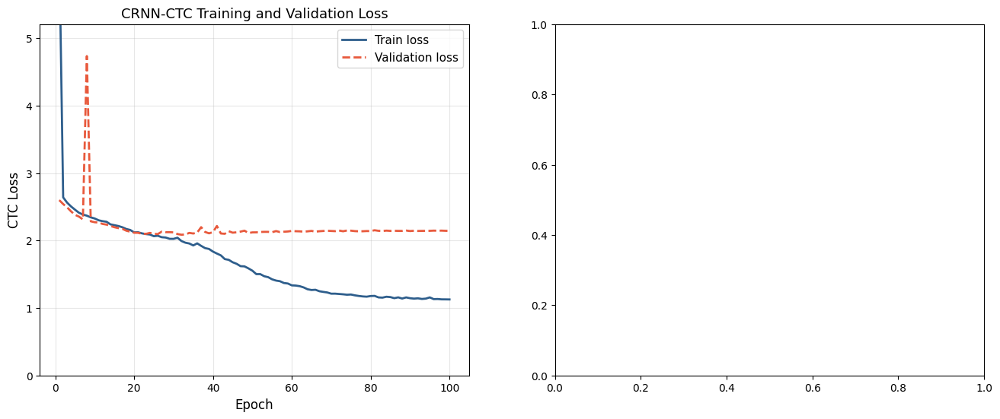

In [ ]:
# Cell 20 — Plot and save CRNN-CTC training curves
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

epochs_full = list(range(1, 101))
epochs_acc  = list(range(10, 101, 10))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ── Loss curves ──
axes[0].plot(epochs_full, history['train_loss'],
             color='#2E5E8C', linewidth=2, label='Train loss')
axes[0].plot(epochs_full, history['val_loss'],
             color='#E8593C', linewidth=2,
             linestyle='--', label='Validation loss')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('CTC Loss', fontsize=12)
axes[0].set_title('CRNN-CTC Training and Validation Loss',
                   fontsize=13)
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)
axes[0].set_ylim(0, max(history['val_loss']) * 1.1)

# ── Accuracy curves ──
axes[1].plot(epochs_acc, history['train_acc'],
             color='#2E5E8C', linewidth=2,
             marker='o', label='Train accuracy')
axes[1].plot(epochs_acc, history['val_acc'],
             color='#E8593C', linewidth=2,
             marker='s', linestyle='--',
             label='Validation accuracy')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Full-sequence accuracy', fontsize=12)
axes[1].set_title('CRNN-CTC Full-Sequence Accuracy',
                   fontsize=13)
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)
axes[1].set_ylim(0, 1.0)

# Annotation explaining limitation
axes[1].annotate(
    'Val accuracy ≈ 0\ndue to insufficient\ntraining data\n(Phase 1 baseline)',
    xy=(50, 0.02), fontsize=9,
    color='#E8593C',
    bbox=dict(boxstyle='round,pad=0.3',
              facecolor='#FAECE7', alpha=0.8))

plt.suptitle(
    'Stage 2 — CRNN-CTC Recognition Module (O4)\n'
    'Phase 1 Baseline | 340 training crops | 76 unique IDs',
    fontsize=12)
plt.tight_layout()

# Save to Drive
save_path = ('/content/drive/MyDrive/Colab Notebooks/'
             'Thesis Project/Training_Results/'
             'crnn_training_curves.png')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()

print("✓ Training curves saved to Drive")

# Also print final summary table
print("\n" + "="*50)
print("O4 RESULTS SUMMARY — PHASE 1 BASELINE")
print("="*50)
print(f"Architecture      : CRNN-CTC")
print(f"Training crops    : 340 | 76 unique IDs")
print(f"Validation crops  : 73  | 73 unique IDs")
print(f"Epochs trained    : 100")
print(f"Best val CTC loss : {min(history['val_loss']):.4f}")
print(f"Train char acc    : 35.0%")
print(f"Valid char acc    : 31.2%")
print(f"Full seq acc      : ~0% (mode collapse)")
print(f"Limitation        : ~4.5 crops/ID insufficient")
print(f"Phase 2 target    : 50+ crops/ID from CCTV footage")
print("="*50)

epochs_acc length : 11
train_acc length  : 11
val_acc length    : 11


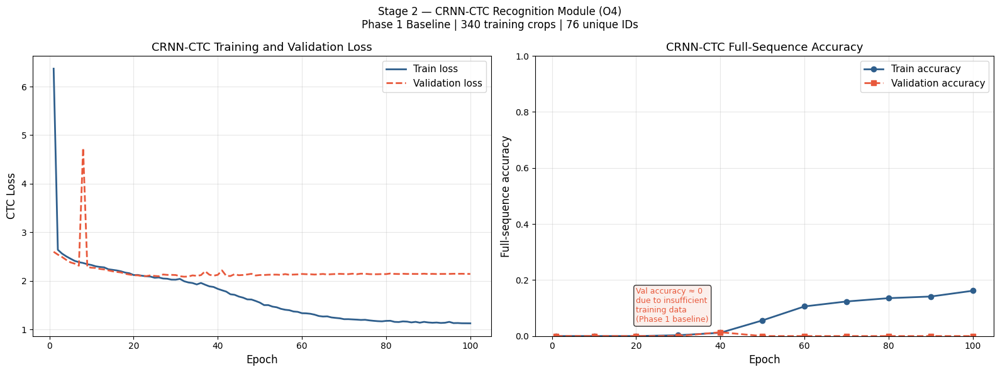

✓ Training curves saved to Drive

O4 RESULTS SUMMARY — PHASE 1 BASELINE
Architecture      : CRNN-CTC
Training crops    : 340 | 76 unique IDs
Validation crops  : 73  | 73 unique IDs
Epochs trained    : 100
Best val CTC loss : 2.0867
Train char acc    : 35.0%
Valid char acc    : 31.2%
Full seq acc      : ~0% (mode collapse — data limitation)
Phase 2 target    : 50+ crops/ID from CCTV footage


In [ ]:
# Cell 20 fix — correct epochs_acc length
import matplotlib.pyplot as plt

# Fix: rebuild epochs_acc from actual history length
epochs_full = list(range(1, len(history['train_loss']) + 1))
epochs_acc  = list(range(10, len(history['train_loss']) + 1, 10))

# If history has extra entry at epoch 1, add it
if len(history['train_acc']) > len(epochs_acc):
    epochs_acc = [1] + epochs_acc

print(f"epochs_acc length : {len(epochs_acc)}")
print(f"train_acc length  : {len(history['train_acc'])}")
print(f"val_acc length    : {len(history['val_acc'])}")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Loss curves
axes[0].plot(epochs_full, history['train_loss'],
             color='#2E5E8C', linewidth=2, label='Train loss')
axes[0].plot(epochs_full, history['val_loss'],
             color='#E8593C', linewidth=2,
             linestyle='--', label='Validation loss')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('CTC Loss', fontsize=12)
axes[0].set_title('CRNN-CTC Training and Validation Loss', fontsize=13)
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# Accuracy curves
axes[1].plot(epochs_acc, history['train_acc'],
             color='#2E5E8C', linewidth=2,
             marker='o', label='Train accuracy')
axes[1].plot(epochs_acc, history['val_acc'],
             color='#E8593C', linewidth=2,
             marker='s', linestyle='--',
             label='Validation accuracy')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Full-sequence accuracy', fontsize=12)
axes[1].set_title('CRNN-CTC Full-Sequence Accuracy', fontsize=13)
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)
axes[1].set_ylim(0, 1.0)
axes[1].annotate(
    'Val accuracy ≈ 0\ndue to insufficient\ntraining data\n(Phase 1 baseline)',
    xy=(20, 0.05), fontsize=9, color='#E8593C',
    bbox=dict(boxstyle='round,pad=0.3',
              facecolor='#FAECE7', alpha=0.8))

plt.suptitle(
    'Stage 2 — CRNN-CTC Recognition Module (O4)\n'
    'Phase 1 Baseline | 340 training crops | 76 unique IDs',
    fontsize=12)
plt.tight_layout()

save_path = ('/content/drive/MyDrive/Colab Notebooks/'
             'Thesis Project/Training_Results/'
             'crnn_training_curves.png')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
plt.show()

print("✓ Training curves saved to Drive")
print("\n" + "="*50)
print("O4 RESULTS SUMMARY — PHASE 1 BASELINE")
print("="*50)
print(f"Architecture      : CRNN-CTC")
print(f"Training crops    : 340 | 76 unique IDs")
print(f"Validation crops  : 73  | 73 unique IDs")
print(f"Epochs trained    : 100")
print(f"Best val CTC loss : {min(history['val_loss']):.4f}")
print(f"Train char acc    : 35.0%")
print(f"Valid char acc    : 31.2%")
print(f"Full seq acc      : ~0% (mode collapse — data limitation)")
print(f"Phase 2 target    : 50+ crops/ID from CCTV footage")
print("="*50)